<font size=6><b> 데이콘 Basic 전화 해지 여부 분류 AI 경진대회
* ref: https://dacon.io/competitions/official/236075/overview/description

In [5]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings(action='ignore')

sns.set() 
#-------------------- 차트 관련 속성 (한글처리, 그리드) -----------
plt.rcParams['font.family']= 'Malgun Gothic'  # 한글 처리
plt.rcParams['axes.unicode_minus'] = False  # -, $ 등등에 표현 특수기호로 버리지 말고 다 써줘라.

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
# from sklearn.ensemble import RandomForest
from sklearn.metrics import accuracy_score

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score, recall_score 
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_auc_score

In [7]:
train = pd.read_csv('./datasets/train.csv')
test = pd.read_csv('./datasets/test.csv')
train.head()

,ID,가입일,음성사서함이용,주간통화시간,주간통화횟수,주간통화요금,저녁통화시간,저녁통화횟수,저녁통화요금,밤통화시간,밤통화횟수,밤통화요금,상담전화건수,전화해지여부
0,TRAIN_00000,329,0,99.2,93,27.3,268.8,68,28.92,262.9,328,32.89,2,0
1,TRAIN_00001,2,80,323.9,323,83.7,269.4,326,32.09,322.8,209,32.32,2,0
2,TRAIN_00002,93,28,282.4,323,34.2,207.0,322,32.82,280.8,328,8.28,0,0
3,TRAIN_00003,223,1,221.4,223,25.1,233.0,61,23.90,203.8,234,9.36,0,0
4,TRAIN_00004,222,0,96.3,222,28.7,223.9,69,28.08,263.1,223,2.80,8,0


In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30200 entries, 0 to 30199
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ID       30200 non-null  object 
 1   가입일      30200 non-null  int64  
 2   음성사서함이용  30200 non-null  int64  
 3   주간통화시간   30200 non-null  float64
 4   주간통화횟수   30200 non-null  int64  
 5   주간통화요금   30200 non-null  float64
 6   저녁통화시간   30200 non-null  float64
 7   저녁통화횟수   30200 non-null  int64  
 8   저녁통화요금   30200 non-null  float64
 9   밤통화시간    30200 non-null  float64
 10  밤통화횟수    30200 non-null  int64  
 11  밤통화요금    30200 non-null  float64
 12  상담전화건수   30200 non-null  int64  
 13  전화해지여부   30200 non-null  int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 3.2+ MB


In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12943 entries, 0 to 12942
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ID       12943 non-null  object 
 1   가입일      12943 non-null  int64  
 2   음성사서함이용  12943 non-null  int64  
 3   주간통화시간   12943 non-null  float64
 4   주간통화횟수   12943 non-null  int64  
 5   주간통화요금   12943 non-null  float64
 6   저녁통화시간   12943 non-null  float64
 7   저녁통화횟수   12943 non-null  int64  
 8   저녁통화요금   12943 non-null  float64
 9   밤통화시간    12943 non-null  float64
 10  밤통화횟수    12943 non-null  int64  
 11  밤통화요금    12943 non-null  float64
 12  상담전화건수   12943 non-null  int64  
dtypes: float64(6), int64(6), object(1)
memory usage: 1.3+ MB


In [10]:
train = train.set_index('ID')
test = test.set_index('ID')

# EDA

In [11]:
## TODO:: 불균형 데이터 처리, 필요
train['전화해지여부'].value_counts()

0    26882
1     3318
Name: 전화해지여부, dtype: int64

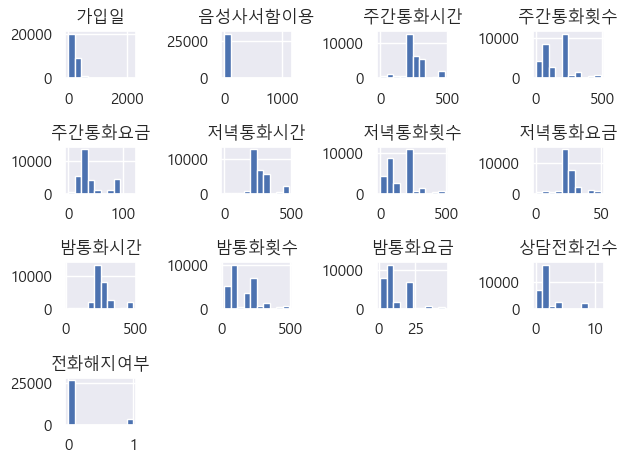

In [12]:
## TODO:: data Scaling 필요
train.hist()
plt.tight_layout()
plt.show()

In [13]:
train.columns

Index(['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수', '전화해지여부'],
      dtype='object')

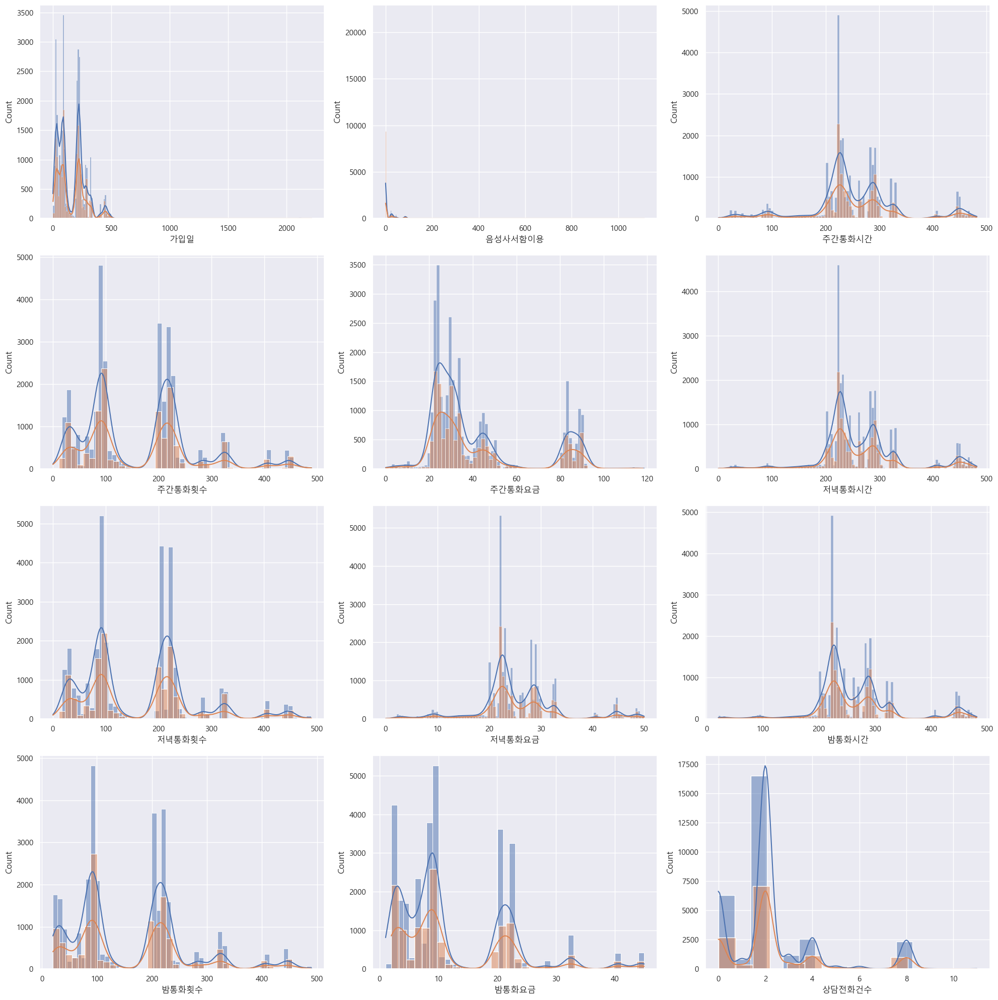

In [14]:
# Train file과 Test file의 분포 --> 분포 거의 비슷함.
col_list = ['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']

plt.figure(figsize=(20,20))
for i, col in enumerate(col_list):
    plt.subplot(4,3, i+1)
    sns.histplot(data=train, x=col, kde=True)
    sns.histplot(data=test, x=col, kde=True)
    
plt.tight_layout()
plt.show()

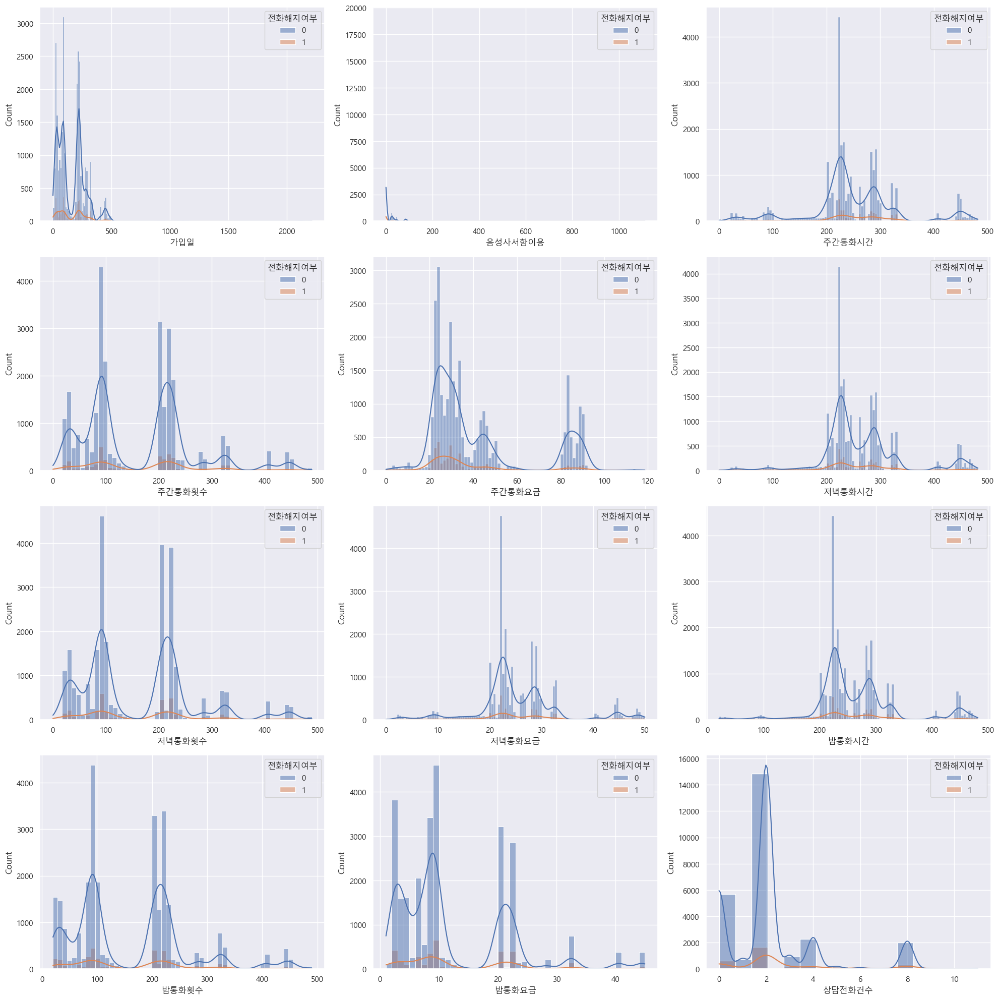

In [15]:
col_list = ['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']

plt.figure(figsize=(20,20))
for i, col in enumerate(col_list):
    plt.subplot(4,3, i+1)
    sns.histplot(data=train, x=col, hue='전화해지여부', kde=True)
    
plt.tight_layout()
plt.show()

## Target Feature

class 비율 : 10.986755
0    26882
1     3318
Name: 전화해지여부, dtype: int64


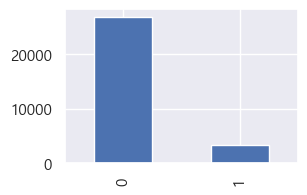

In [16]:
print( f"class 비율 : {len(train[train['전화해지여부']== 1]) / len(train) * 100 :2f}" )
print( train['전화해지여부'].value_counts() )
train['전화해지여부'].value_counts().plot(kind='bar', figsize=(3,2))
plt.show()

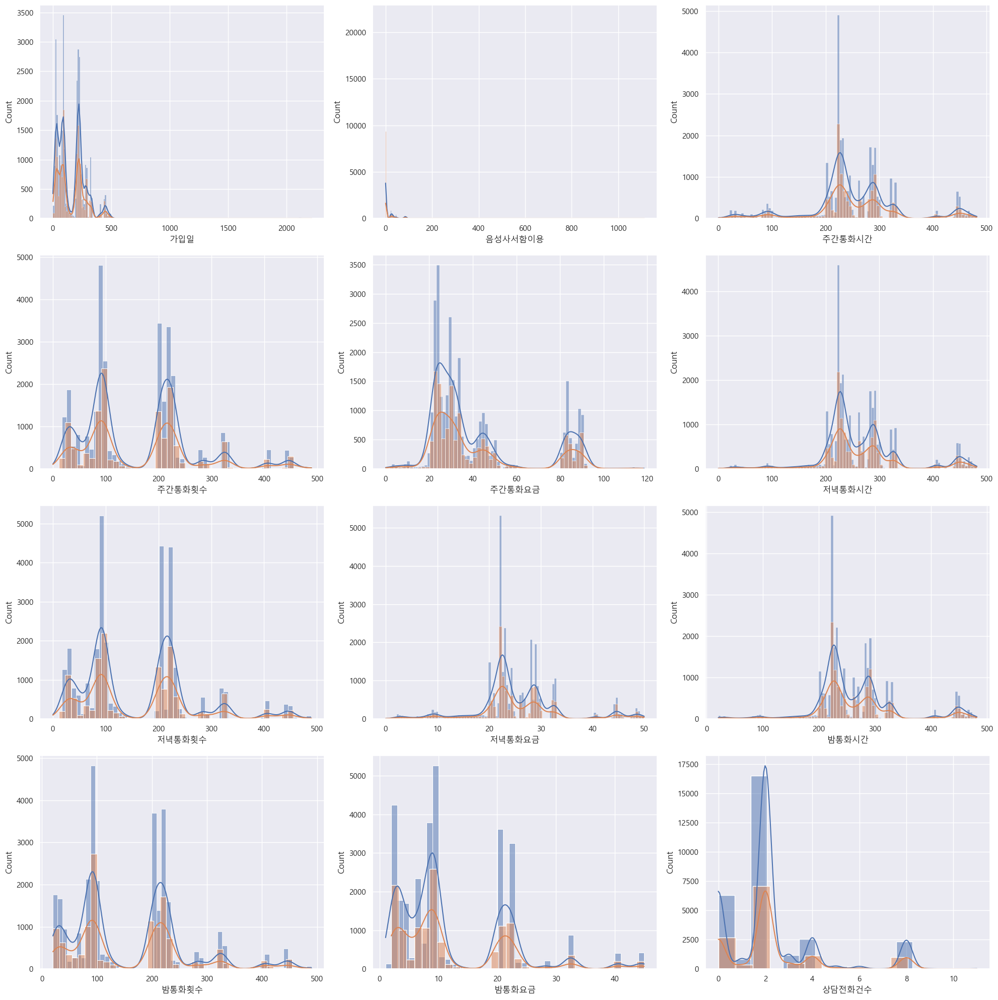

In [17]:
col_list = ['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']

plt.figure(figsize=(20,20))
for i, col in enumerate(col_list):
    plt.subplot(4,3, i+1)
    sns.histplot(data=train, x=col, kde=True)
    sns.histplot(data=test, x=col, kde=True)
    
plt.tight_layout()
plt.show()

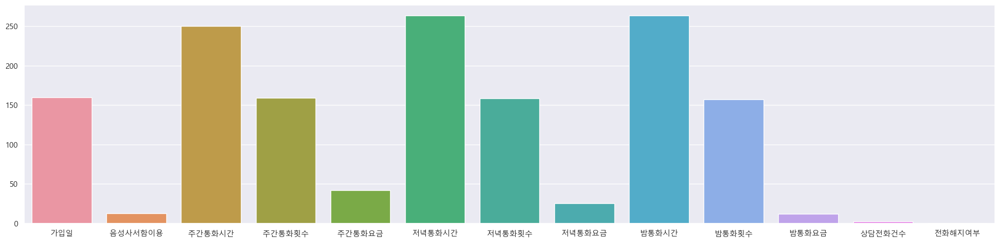

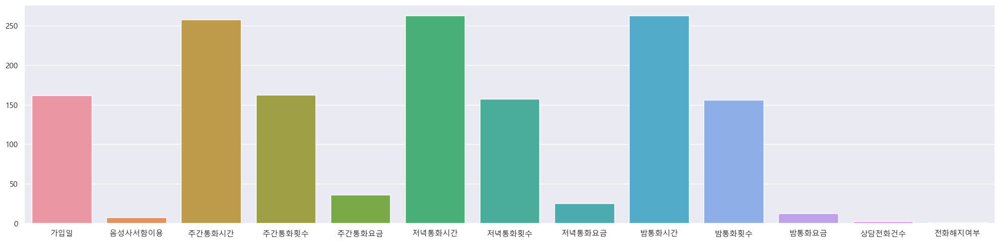

In [18]:
# Class별 Feature 평균값 확인
train0 = train[train['전화해지여부']==0]
train1 = train[train['전화해지여부']==1]

train0_mean = train0.mean()
train1_mean = train1.mean()

plt.figure(figsize=(20,5))
sns.barplot(x=train0_mean.index, y=train0_mean)
plt.tight_layout()

plt.figure(figsize=(20,5))
sns.barplot(x=train1_mean.index, y=train1_mean)
plt.tight_layout()
plt.show()


In [19]:
# 0인 data의 음성사서함 이용이 max, mean 모두 크다.
#      통화 해지할거니까, 음성사서함을 많이 남겨두지 않나??
# 저녁 통화시간 통화횟수 요금의 min값이 1인 데이터가 더 크다. 
#     통화 해지하는 사람은 모두 저녁에 통화를 한다. (일단 Train data에 따르면)
#      저녁에 통화 했냐안했냐로 파생을 만들어야하나??
# 의외로 상담전화 건수에는 차이가 없음.
train0.describe()

,가입일,음성사서함이용,주간통화시간,주간통화횟수,주간통화요금,저녁통화시간,저녁통화횟수,저녁통화요금,밤통화시간,밤통화횟수,밤통화요금,상담전화건수,전화해지여부
count,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.000000,26882.0
mean,159.441857,12.587159,249.674619,158.784131,41.669660,263.251451,158.628078,25.389364,263.512730,157.158954,12.026648,2.246931,0.0
std,124.193729,25.566918,84.830161,101.747847,23.536478,74.741785,102.359429,8.223539,74.529181,101.785060,9.432624,2.018357,0.0
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,20.800000,20.000000,1.040000,0.000000,0.0
25%,63.000000,0.000000,222.500000,88.000000,24.500000,223.700000,87.000000,22.220000,223.700000,87.000000,4.480000,2.000000,0.0
50%,116.000000,1.000000,233.600000,115.000000,31.200000,242.950000,112.000000,23.300000,242.700000,107.000000,9.020000,2.000000,0.0
75%,228.000000,23.000000,289.400000,223.000000,46.200000,290.400000,223.000000,28.820000,290.500000,222.000000,20.290000,2.000000,0.0
max,2212.000000,1112.000000,481.200000,489.000000,118.600000,481.600000,489.000000,49.980000,481.800000,490.000000,44.980000,11.000000,0.0


In [20]:
train1.describe()

,가입일,음성사서함이용,주간통화시간,주간통화횟수,주간통화요금,저녁통화시간,저녁통화횟수,저녁통화요금,밤통화시간,밤통화횟수,밤통화요금,상담전화건수,전화해지여부
count,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.000000,3318.0
mean,162.088608,7.587101,257.764708,162.348403,36.406841,263.212899,157.230561,25.433927,262.835142,156.143761,12.463539,2.621459,1.0
std,120.112890,18.348552,80.513591,100.104352,19.427776,68.344831,100.908386,7.490529,67.395499,101.216735,9.256371,2.269361,0.0
min,1.000000,0.000000,0.100000,0.000000,0.100000,21.100000,20.000000,2.290000,22.600000,20.000000,2.020000,0.000000,1.0
25%,67.000000,0.000000,224.200000,88.000000,24.000000,223.900000,87.000000,22.220000,223.700000,83.000000,6.320000,2.000000,1.0
50%,135.000000,1.000000,250.250000,143.000000,29.800000,244.100000,111.000000,23.320000,244.300000,110.000000,9.230000,2.000000,1.0
75%,229.000000,1.000000,290.800000,223.000000,40.575000,289.900000,223.000000,28.880000,290.100000,223.000000,20.330000,3.000000,1.0
max,2012.000000,117.000000,481.900000,489.000000,117.800000,481.400000,489.000000,49.890000,481.000000,488.000000,44.890000,11.000000,1.0


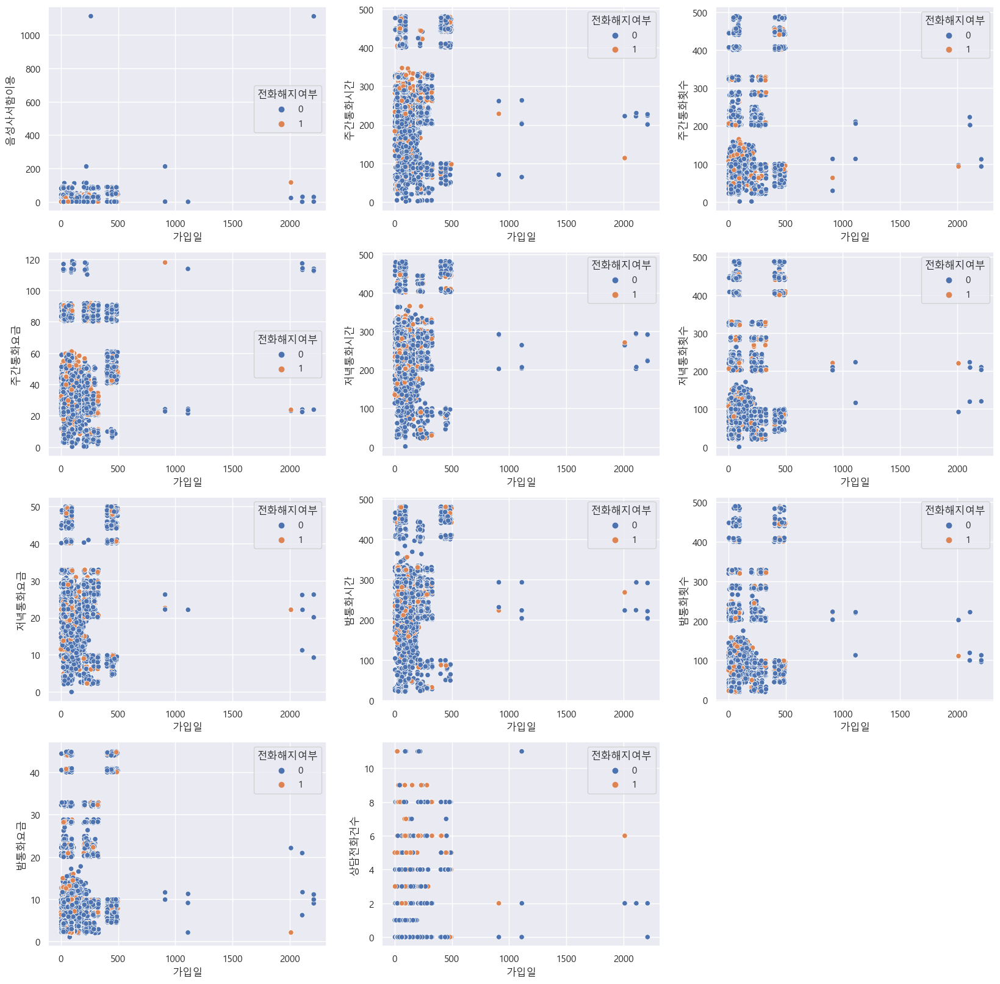

In [21]:
col_list1 = ['음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']


plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='가입일',  y=col, hue='전화해지여부')

plt.show()

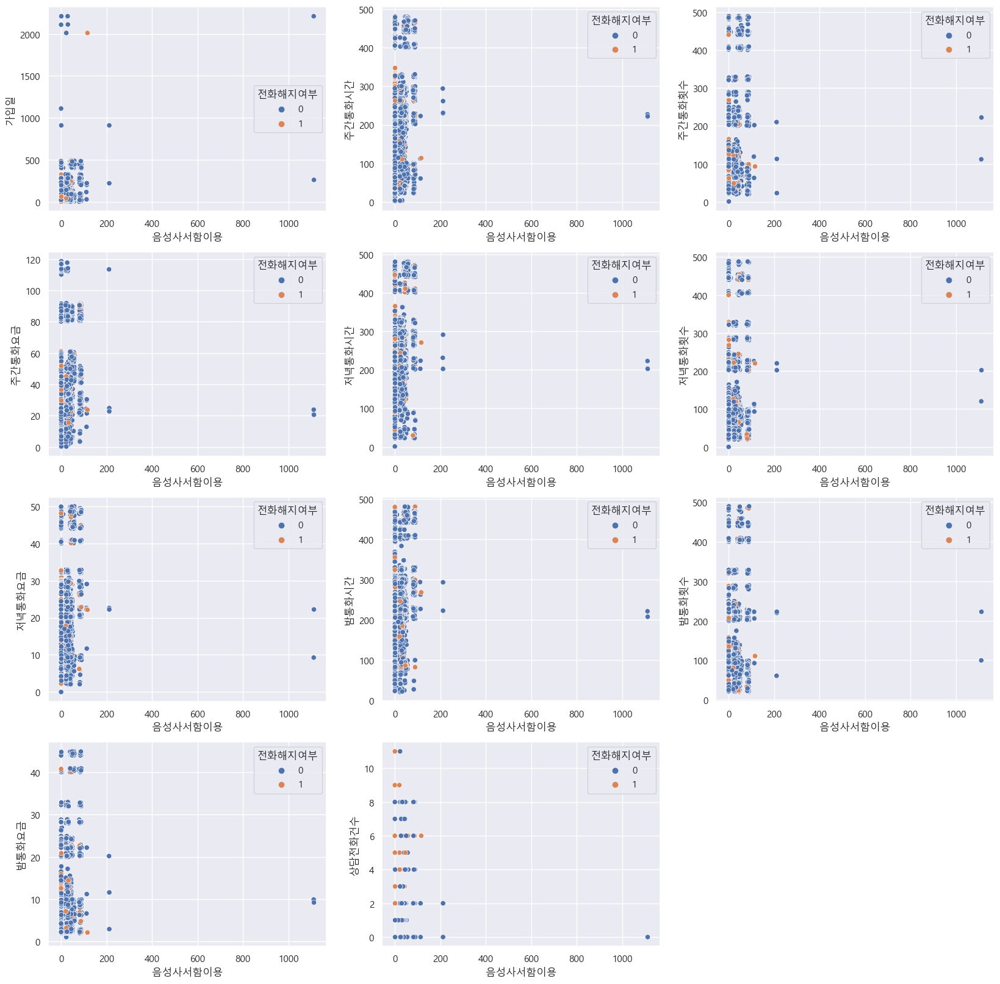

In [22]:
# Train에 음성사서함은 1000건 이상 사용하는 해지 안하는 데이터가 2건 있음.
col_list1 = ['가입일', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']


plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='음성사서함이용',  y=col, hue='전화해지여부')

plt.show()

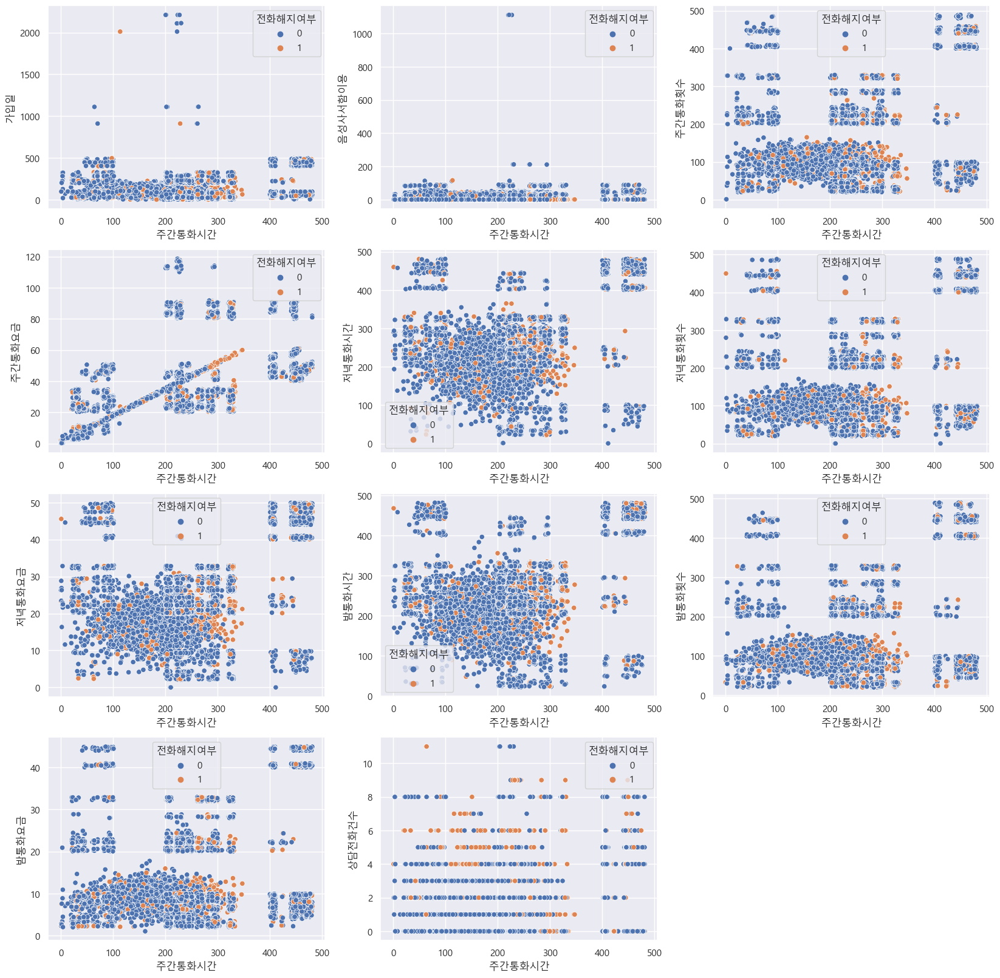

In [23]:
# 주간 통화시간과 주간 통화요금이 선형관계를 보인다는 점 빼고 딱히 특징이 없음.
col_list1 = ['가입일', '음성사서함이용', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']

plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='주간통화시간',  y=col, hue='전화해지여부')

plt.show()

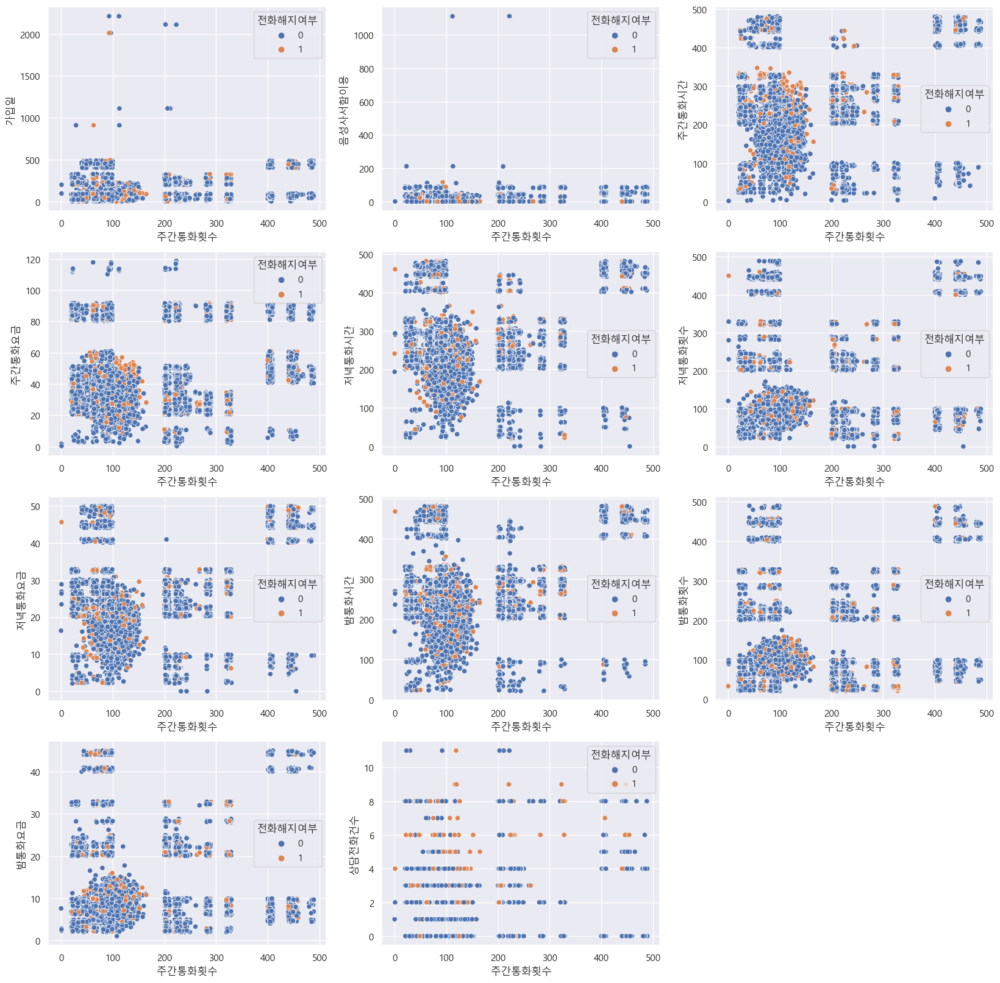

In [24]:
col_list1 = ['가입일', '음성사서함이용', '주간통화시간', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']


plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='주간통화횟수',  y=col, hue='전화해지여부')

plt.show()

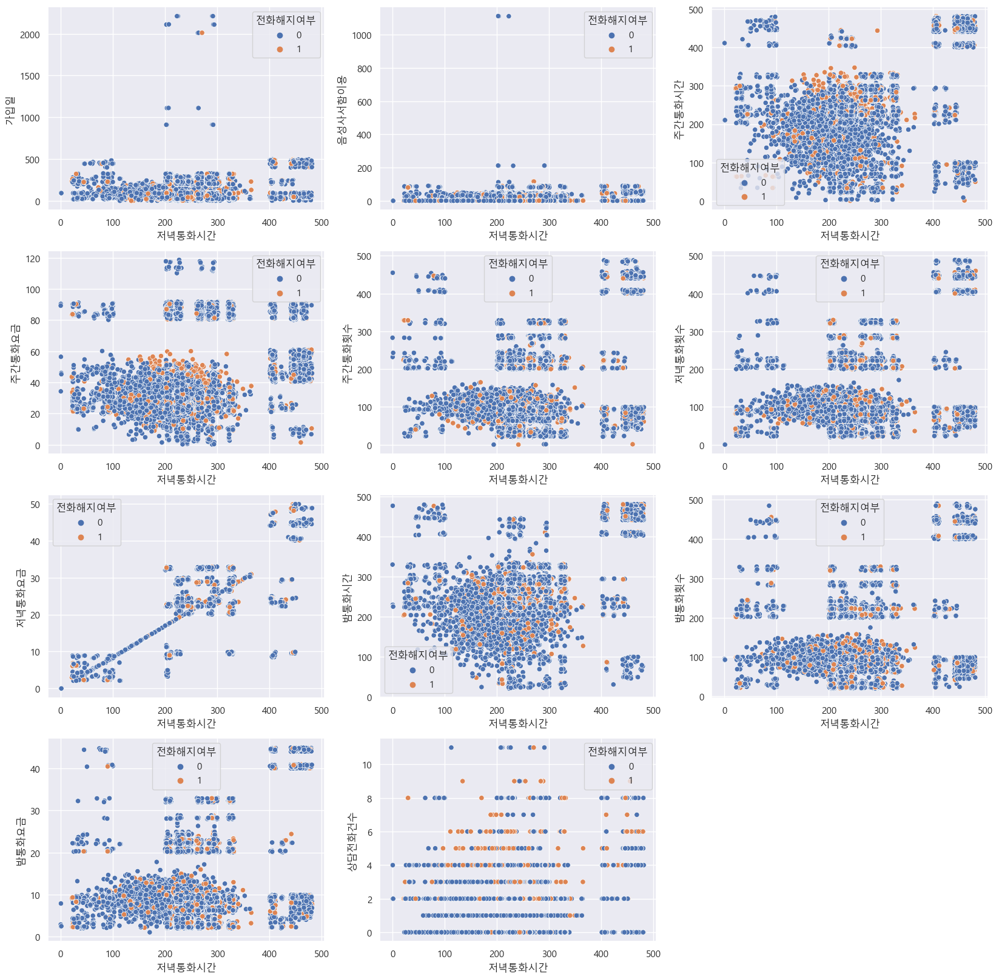

In [25]:
col_list1 = ['가입일', '음성사서함이용', '주간통화시간', '주간통화요금', '주간통화횟수', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']


plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='저녁통화시간',  y=col, hue='전화해지여부')

plt.show()

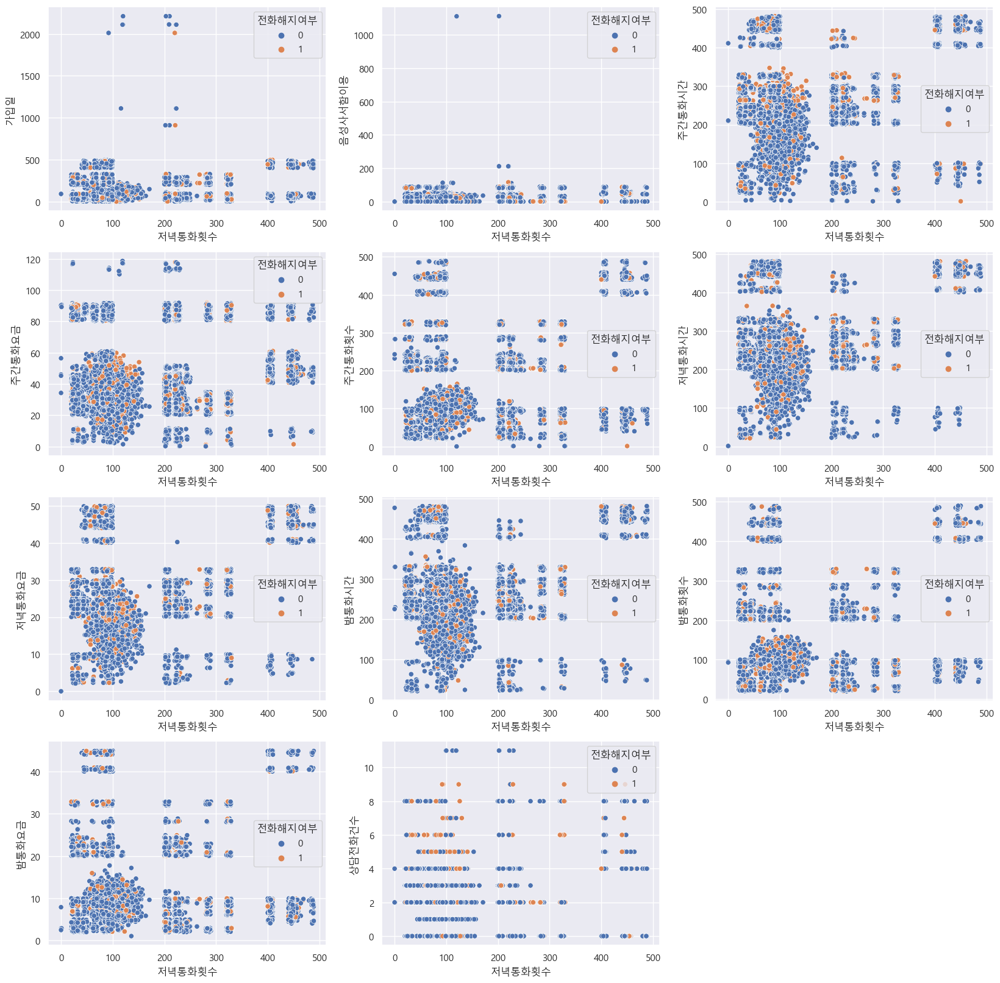

In [26]:
col_list1 = ['가입일', '음성사서함이용', '주간통화시간', '주간통화요금', '주간통화횟수', '저녁통화시간', 
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']


plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='저녁통화횟수', y=col, hue='전화해지여부')

plt.show()

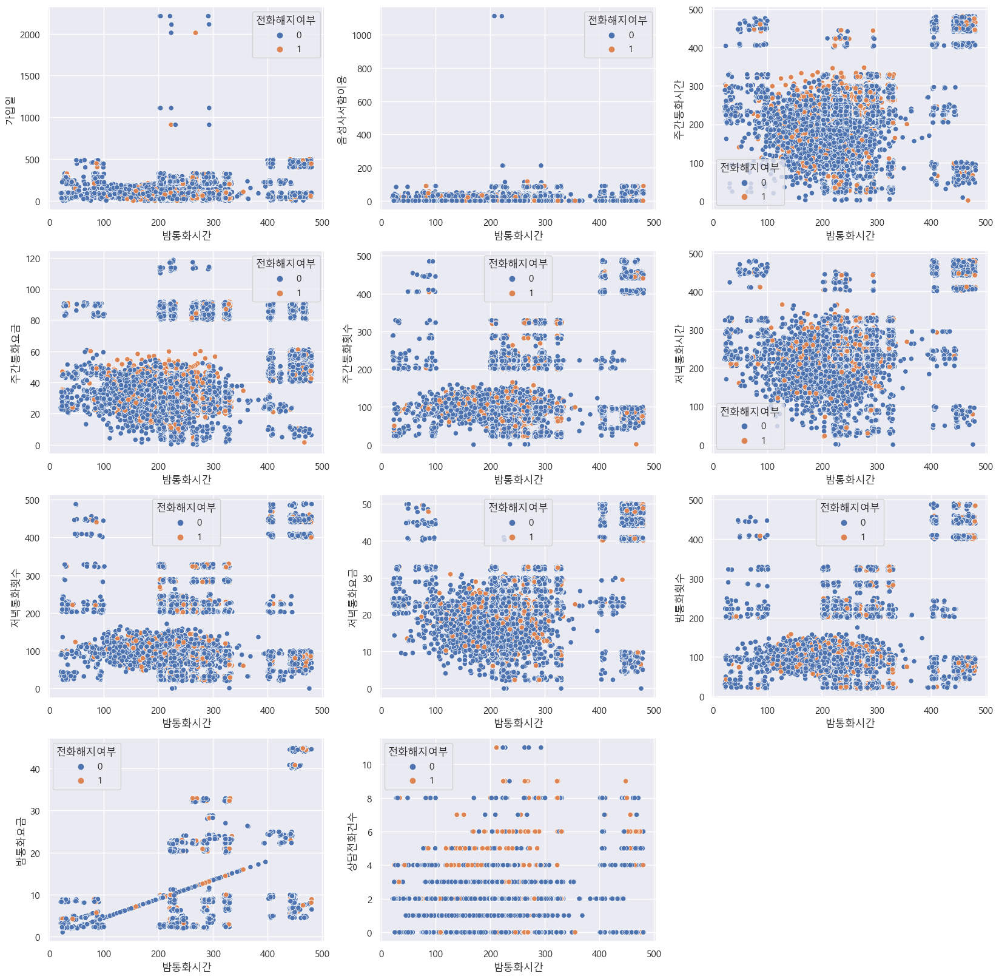

In [27]:
col_list1 = ['가입일', '음성사서함이용', '주간통화시간', '주간통화요금', '주간통화횟수', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화횟수', '밤통화요금', '상담전화건수']


plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='밤통화시간',  y=col, hue='전화해지여부')

plt.show()

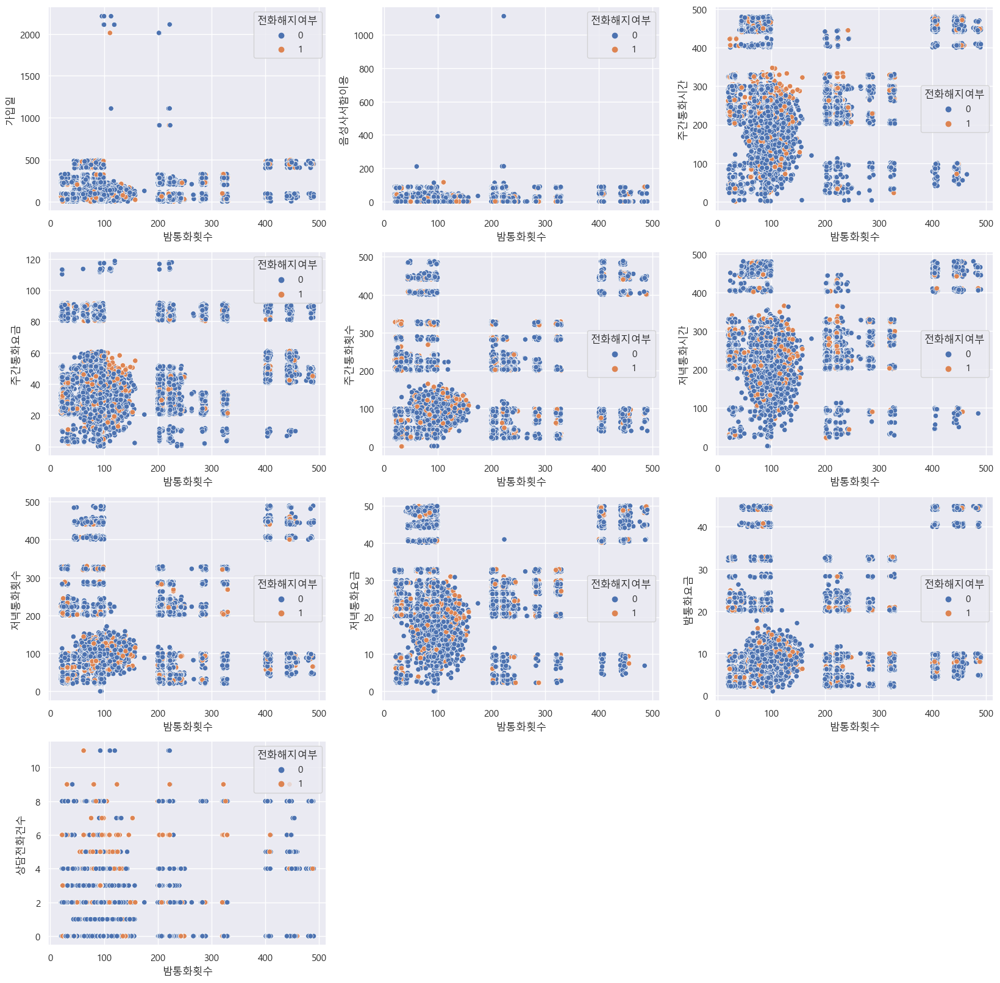

In [28]:
col_list1 = ['가입일', '음성사서함이용', '주간통화시간', '주간통화요금', '주간통화횟수', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금',  '밤통화요금', '상담전화건수']

plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='밤통화횟수',  y=col, hue='전화해지여부')

plt.show()

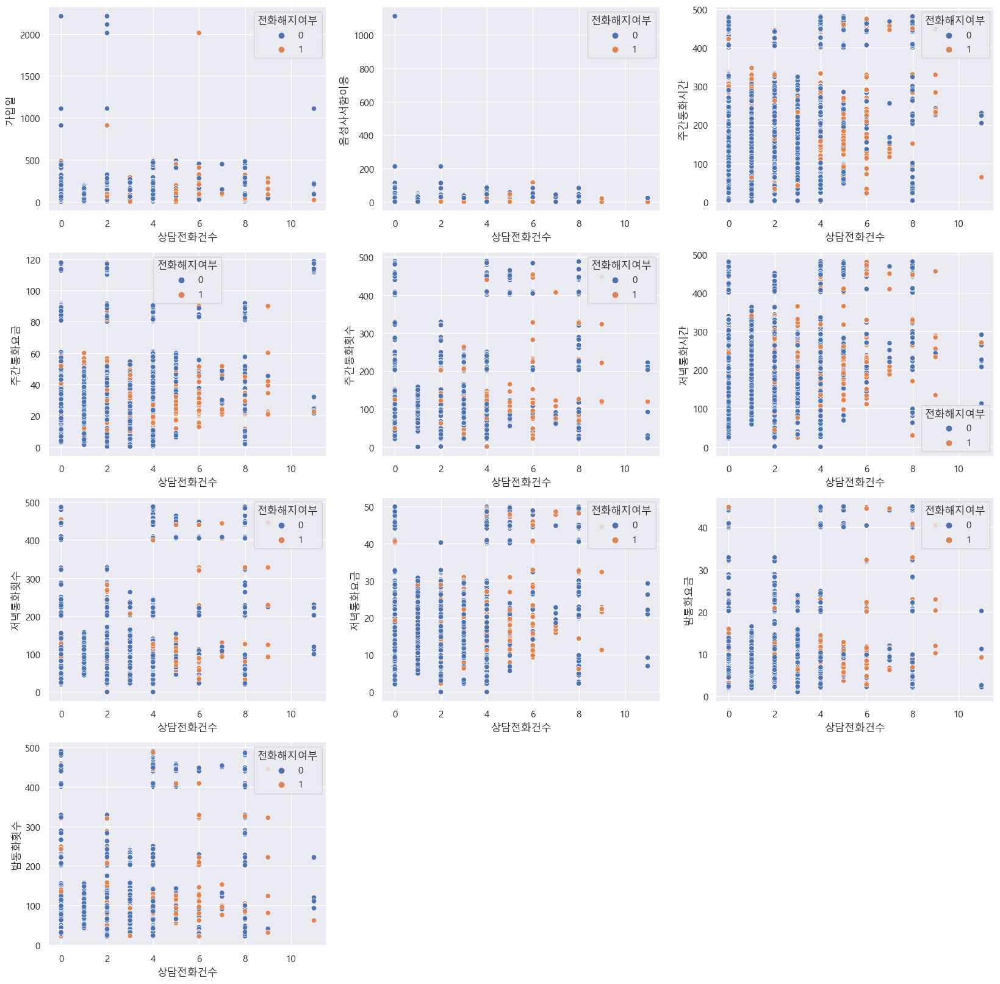

In [29]:
col_list1 = ['가입일', '음성사서함이용', '주간통화시간', '주간통화요금', '주간통화횟수', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금',  '밤통화요금', '밤통화횟수']

plt.figure(figsize=(20,20))
for i, col in enumerate(col_list1):
    plt.subplot(4,3, i+1)
    sns.scatterplot(data=train, x='상담전화건수',  y=col, hue='전화해지여부')

plt.show()

<Axes: xlabel='가입일', ylabel='음성사서함이용'>

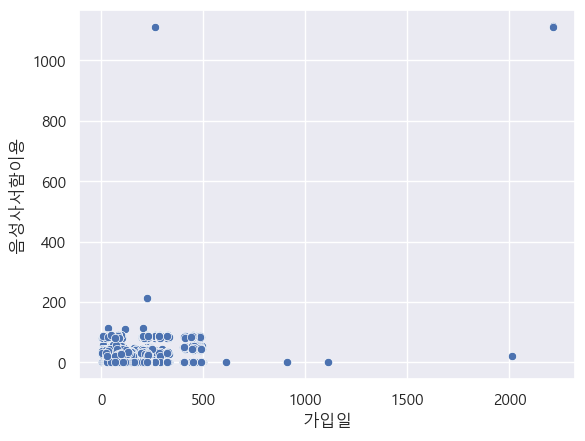

In [30]:
sns.scatterplot(data=test, x='가입일',  y='음성사서함이용')

In [31]:
train.head()

,가입일,음성사서함이용,주간통화시간,주간통화횟수,주간통화요금,저녁통화시간,저녁통화횟수,저녁통화요금,밤통화시간,밤통화횟수,밤통화요금,상담전화건수,전화해지여부
ID,,,,,,,,,,,,,
TRAIN_00000,329,0,99.2,93,27.3,268.8,68,28.92,262.9,328,32.89,2,0
TRAIN_00001,2,80,323.9,323,83.7,269.4,326,32.09,322.8,209,32.32,2,0
TRAIN_00002,93,28,282.4,323,34.2,207.0,322,32.82,280.8,328,8.28,0,0
TRAIN_00003,223,1,221.4,223,25.1,233.0,61,23.90,203.8,234,9.36,0,0
TRAIN_00004,222,0,96.3,222,28.7,223.9,69,28.08,263.1,223,2.80,8,0


In [32]:
# time_gubun
train['시간구분'] = 0
train['시간구분'] = np.where((train['저녁통화시간']>train['주간통화시간']) & (train['저녁통화시간']>train['밤통화시간']), 1, train['시간구분'])
train['시간구분'] = np.where((train['밤통화시간']>train['주간통화시간']) & (train['밤통화시간']>train['저녁통화시간']), 2, train['시간구분'])
train['시간구분'].value_counts() 

2    10496
1    10391
0     9313
Name: 시간구분, dtype: int64

In [33]:
train[['시간구분','전화해지여부']].value_counts().sort_index()
# sns.barplot(data=train, x='시간구분', y='전화해지여부')

시간구분  전화해지여부
0     0         8141
      1         1172
1     0         9371
      1         1020
2     0         9370
      1         1126
dtype: int64

In [34]:
train['횟수구분'] = 0
train['횟수구분'] = np.where((train['저녁통화횟수']>train['주간통화횟수']) & (train['저녁통화횟수']>train['밤통화횟수']), 1, train['횟수구분'])
train['횟수구분'] = np.where((train['밤통화횟수']>train['주간통화횟수']) & (train['밤통화횟수']>train['저녁통화횟수']), 2, train['횟수구분'])
train[['시간구분','전화해지여부']].value_counts().sort_index()

시간구분  전화해지여부
0     0         8141
      1         1172
1     0         9371
      1         1020
2     0         9370
      1         1126
dtype: int64

In [35]:
train['전체밤요금'] = train['밤통화시간']*train['밤통화요금']
train['전체저녁요금'] = train['저녁통화시간']*train['저녁통화요금']
train['전체주간요금'] = train['주간통화시간']*train['주간통화요금']

train['전체요금'] = train['전체밤요금']+train['전체저녁요금']+train['전체주간요금']

<Axes: xlabel='횟수구분', ylabel='count'>

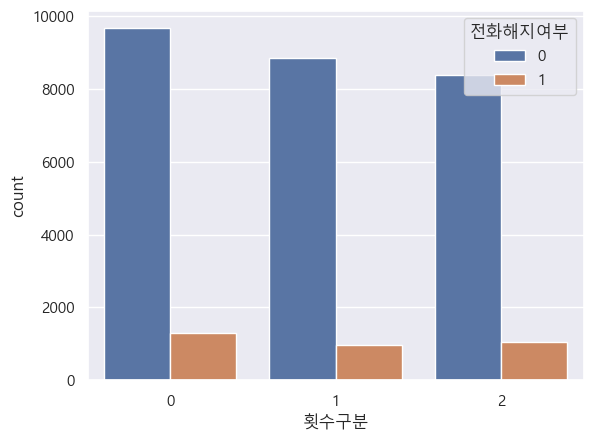

In [36]:
sns.countplot(data=train, x='횟수구분', hue='전화해지여부')

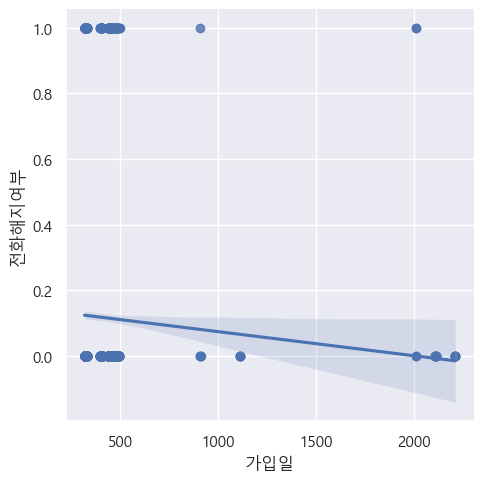

In [37]:
sns.lmplot(data=train[(train['가입일']>300)], x='가입일', y='전화해지여부')

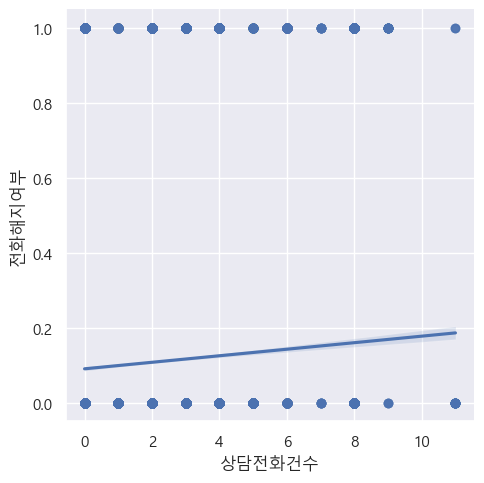

In [39]:
sns.lmplot(data=train, x='상담전화건수', y='전화해지여부')
plt.show()

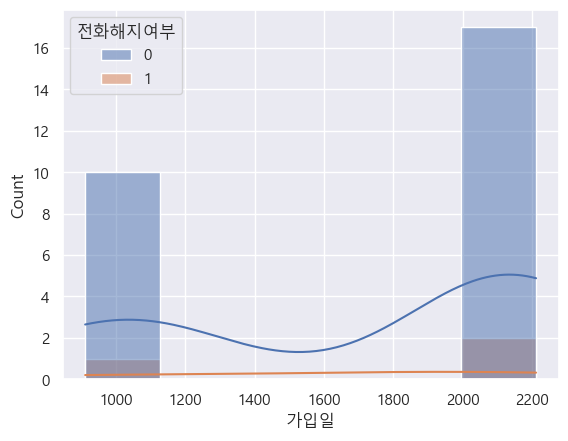

In [40]:
# plt.subplot(1,2,1)
# sns.lmplot(data=train, x='전체요금', y='전화해지여부', axi)
# # plt.subplot(1,2, 2)
sns.histplot(data=train[train['가입일']>500], x='가입일', hue='전화해지여부', kde=True)
plt.show()

## train test 분포

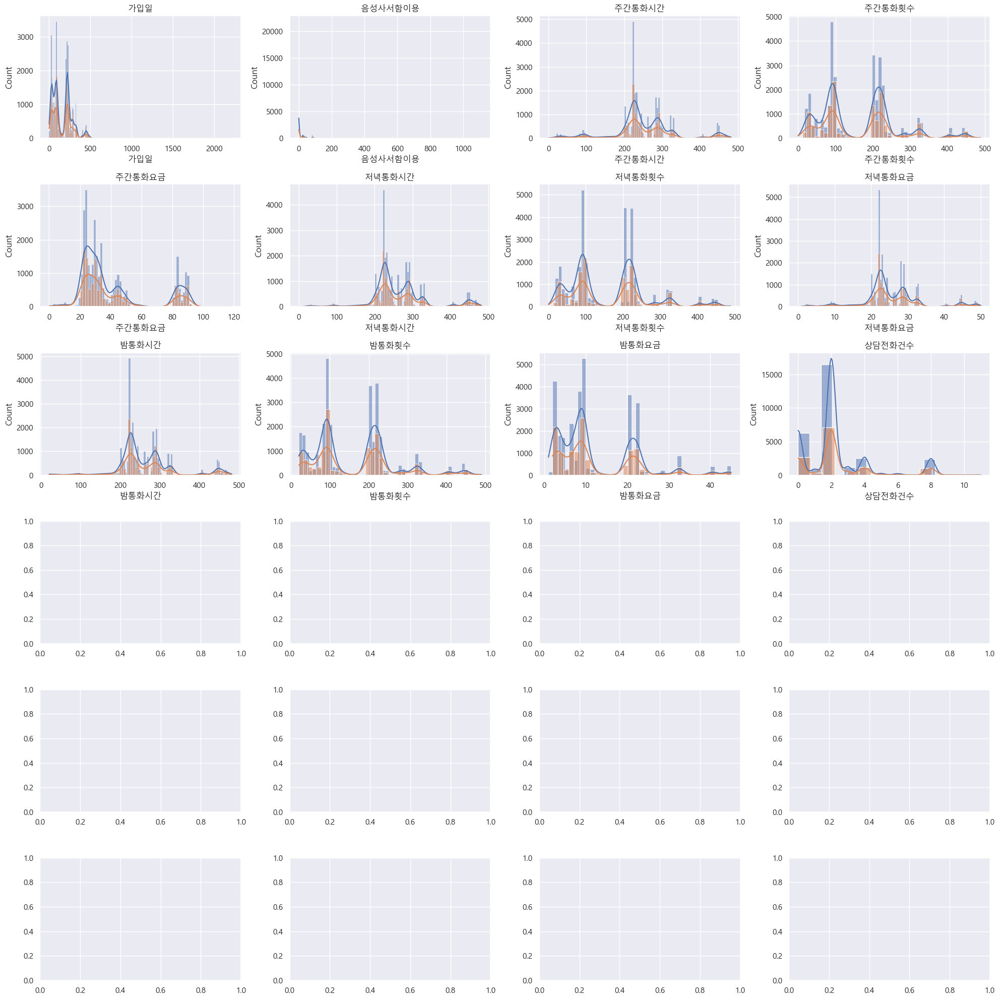

In [41]:
fig, axes = plt.subplots(6, 4, figsize=(20, 20)  ) 

for i, col in enumerate(test.columns) :
    r = i//4
    c = i%4
    axes[r][c].set_title(col)
    sns.histplot(data=train, x=col, ax=axes[r][c],  kde=True )
    sns.histplot(data=test, x=col, ax=axes[r][c],   kde=True )

plt.tight_layout()
plt.show()


## train class별 분포

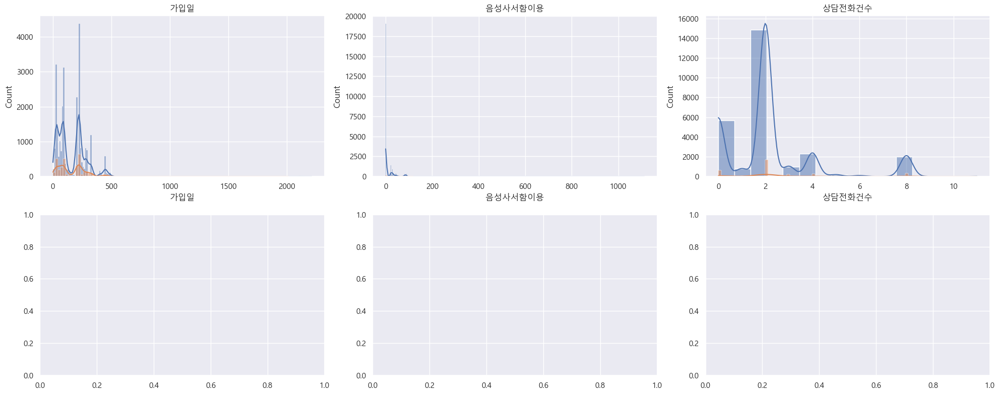

In [42]:
fig, axes = plt.subplots(2, 3, figsize=(20, 8)  ) 

for i, col in enumerate(['가입일','음성사서함이용','상담전화건수']) :
    r = i//3
    c = i%3
    axes[r][c].set_title(col)
    sns.histplot(data=train[train['전화해지여부']==0], x=col, ax=axes[r][c],     kde=True )
    sns.histplot(data=train[train['전화해지여부']==1], x=col, ax=axes[r][c],     kde=True )

plt.tight_layout()
plt.show()


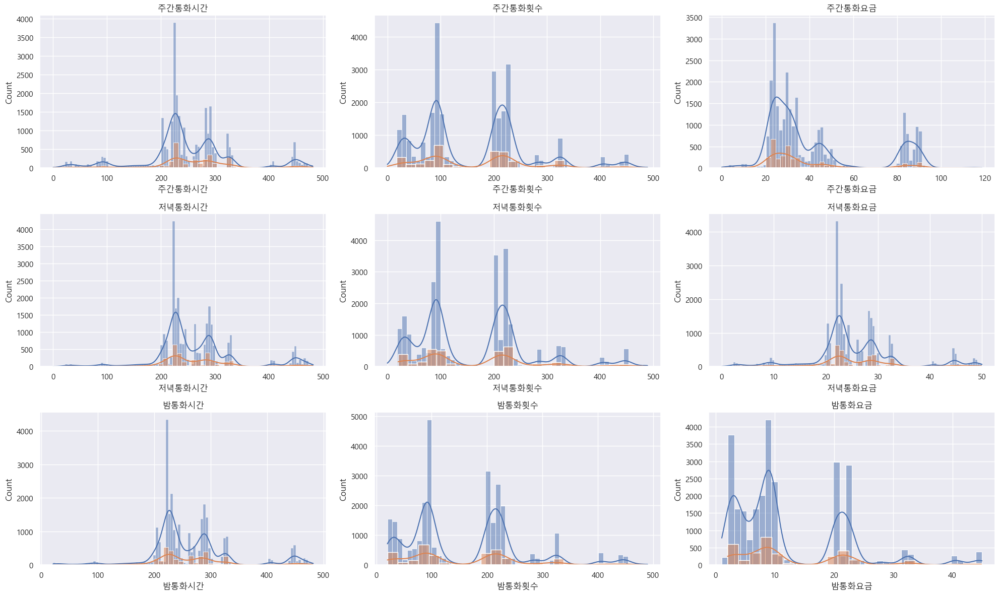

In [43]:
fig, axes = plt.subplots(3, 3, figsize=(20, 12)  ) 

for i, col in enumerate(['주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금']) :
    r = i//3
    c = i%3
    axes[r][c].set_title(col)
    sns.histplot(data=train[train['전화해지여부']==0], x=col, ax=axes[r][c],     kde=True )
    sns.histplot(data=train[train['전화해지여부']==1], x=col, ax=axes[r][c],     kde=True )

plt.tight_layout()
plt.show()

* 주간,저녁,밤 : 통화시간 통화횟수는 비슷한 패턴을 보인다
* <b>주간,저녁,밤 : 통화요금은 다른 패턴을 보인다 --> 요금제????

## 가입일

In [44]:
# train['가입일지수'] = train['가입일'].apply(lambda d :  (d / (2213 -d )) * 100 )
train['가입기간년'] = train['가입일'] // 365
train['가입기간월'] = np.floor(train['가입일'] // 12)
train['가입기간주'] = np.floor(train['가입일'] // 52)
train['가입월']     = np.floor(train['가입일'] / 30) - (  ( np.floor(train['가입일'] / 30) / 12).astype(int) * 12  )  

test['가입기간년']  = test['가입일'] // 365
test['가입기간월']  = np.floor(test['가입일'] // 12)
test['가입기간주']  = np.floor(test['가입일'] // 52)
test['가입월']      = np.floor(test['가입일'] / 30) - (  ( np.floor(train['가입일'] / 30) / 12).astype(int) * 12  )  

### 가입기간년

* 가입년수 2년 이상이면 해지 확률이 거의 없다

In [46]:
s0 = train[train['전화해지여부']==0].shape[0]
s1 = train[train['전화해지여부']==1].shape[0]

In [47]:
train0 = train[train['전화해지여부']==0]
train1 = train[train['전화해지여부']==1]

In [48]:
temp = train0['가입기간년'].value_counts().sort_index()
temp/s0

0    0.953649
1    0.045346
2    0.000149
3    0.000223
5    0.000409
6    0.000223
Name: 가입기간년, dtype: float64

In [49]:
temp = train1['가입기간년'].value_counts().sort_index()
temp/s1

0    0.962025
1    0.037071
2    0.000301
5    0.000603
Name: 가입기간년, dtype: float64

* 전화해지는 대부분 1년 이내에 함.  
<font color='red'>5년차에 해지하는 2명 Outlier 처리하자!!</font>

In [50]:
train[['가입기간년','전화해지여부']].value_counts().sort_index()

가입기간년  전화해지여부
0      0         25636
       1          3192
1      0          1219
       1           123
2      0             4
       1             1
3      0             6
5      0            11
       1             2
6      0             6
dtype: int64

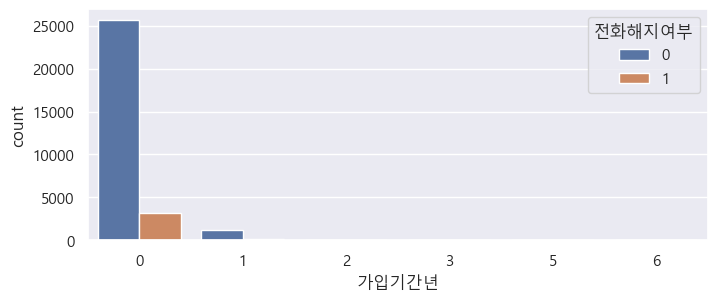

In [51]:
plt.figure(figsize=(8,3))
sns.countplot(data=train    , x='가입기간년',  hue="전화해지여부")
plt.show()

In [52]:
# 5년차에 해지하는 2명 Outlier 처리하자!!
drop_index = train[(train['가입기간년']==5)&(train['전화해지여부']==1)].index.values
train.drop(drop_index, axis=0)

,가입일,음성사서함이용,주간통화시간,주간통화횟수,주간통화요금,저녁통화시간,저녁통화횟수,저녁통화요금,밤통화시간,밤통화횟수,...,시간구분,횟수구분,전체밤요금,전체저녁요금,전체주간요금,전체요금,가입기간년,가입기간월,가입기간주,가입월
ID,,,,,,,,,,,,,,,,,,,,,
TRAIN_00000,329,0,99.2,93,27.3,268.8,68,28.92,262.9,328,...,1,2,8646.781,7773.696,2708.16,19128.637,0,27.0,6.0,10.0
TRAIN_00001,2,80,323.9,323,83.7,269.4,326,32.09,322.8,209,...,0,1,10432.896,8645.046,27110.43,46188.372,0,0.0,0.0,0.0
TRAIN_00002,93,28,282.4,323,34.2,207.0,322,32.82,280.8,328,...,0,2,2325.024,6793.740,9658.08,18776.844,0,7.0,1.0,3.0
TRAIN_00003,223,1,221.4,223,25.1,233.0,61,23.90,203.8,234,...,1,2,1907.568,5568.700,5557.14,13033.408,0,18.0,4.0,7.0
TRAIN_00004,222,0,96.3,222,28.7,223.9,69,28.08,263.1,223,...,2,2,736.680,6287.112,2763.81,9787.602,0,18.0,4.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TRAIN_30195,263,80,289.6,201,21.8,280.5,323,29.88,208.0,66,...,0,1,1930.240,8381.340,6313.28,16624.860,0,21.0,5.0,8.0
TRAIN_30196,283,81,210.7,280,90.5,284.1,202,32.80,287.8,203,...,2,0,1807.384,9318.480,19068.35,30194.214,0,23.0,5.0,9.0
TRAIN_30197,24,0,222.4,33,22.1,233.9,32,22.22,293.6,95,...,2,2,1238.992,5197.258,4915.04,11351.290,0,2.0,0.0,0.0


### 가입기간월

In [53]:
train[['전화해지여부','가입기간월']].value_counts().sort_index()

전화해지여부  가입기간월
0       0.0       202
        1.0      1464
        2.0      2841
        3.0      1302
        4.0       377
                 ... 
1       39.0        6
        40.0       10
        41.0        4
        75.0        1
        167.0       2
Length: 80, dtype: int64

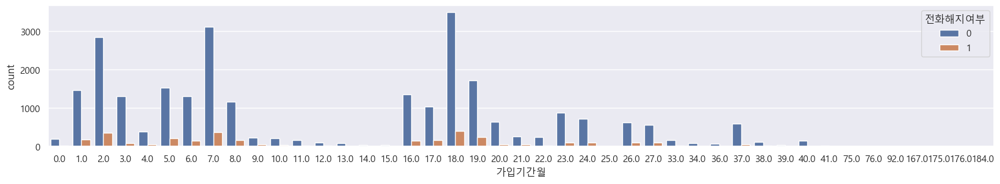

In [54]:
plt.figure(figsize=(20,3))
sns.countplot(data=train    , x='가입기간월', hue="전화해지여부")
plt.show()

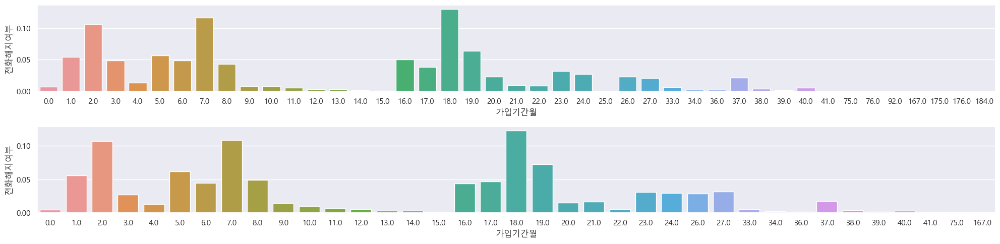

In [55]:
# 해지하는 사람과 해지하는 않는 사람이 월별로 차이가 없음.
# train0['가입기간월'].value_counts()
temp0 = train0.groupby('가입기간월')['전화해지여부'].count().sort_index()/s0
temp0 = temp0.reset_index()
temp1 = train1.groupby('가입기간월')['전화해지여부'].count().sort_index()/s1
temp1 = temp1.reset_index()
# temp0

plt.figure(figsize=(20,5))
plt.subplot(2,1,1)
sns.barplot(data=temp0, x='가입기간월', y='전화해지여부' ) 

plt.subplot(2,1,2)
sns.barplot(data=temp1, x='가입기간월', y='전화해지여부') 

plt.tight_layout()
plt.show()

* 가입기간 17주 이상이면 해지 확률이 거의 없다

In [56]:
train[['가입기간주','전화해지여부']].value_counts().sort_index()

가입기간주  전화해지여부
0.0    0         6044
       1          666
1.0    0         7161
       1          894
2.0    0          778
       1          129
3.0    0         1968
       1          229
4.0    0         6404
       1          795
5.0    0         2099
       1          278
6.0    0         1182
       1          201
7.0    0          244
       1           25
8.0    0          771
       1           78
9.0    0          204
       1           20
17.0   0            4
       1            1
21.0   0            6
38.0   0            2
       1            2
40.0   0            9
42.0   0            6
dtype: int64

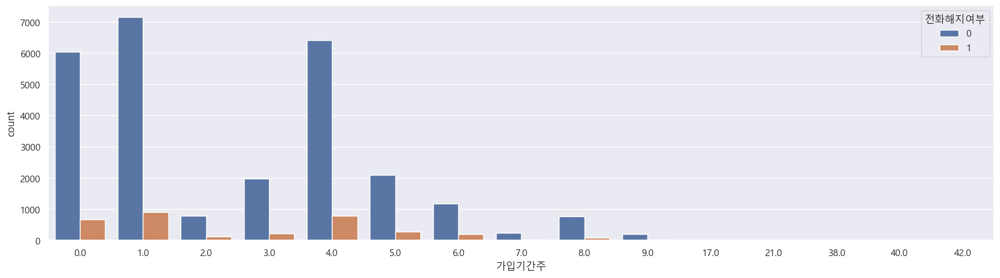

In [57]:
plt.figure(figsize=(20,5))
sns.countplot(data=train    , x='가입기간주', hue="전화해지여부")
plt.show()

### 가입월

* 가입/해지 실적이 저조한 달이 있다
    * 4, 5, 11월 : 매우 저조 
    * 8, 9, 10월 : 상대적 저조 

In [58]:
train[['가입월','전화해지여부']].value_counts().sort_index()

가입월   전화해지여부
0.0   0         3074
      1          364
1.0   0         3368
      1          352
2.0   0         4698
      1          525
3.0   0         3443
      1          484
4.0   0          589
      1           77
5.0   0          170
      1           31
6.0   0         2313
      1          294
7.0   0         5302
      1          661
8.0   0         1123
      1          120
9.0   0         1605
      1          209
10.0  0         1145
      1          189
11.0  0           52
      1           12
dtype: int64

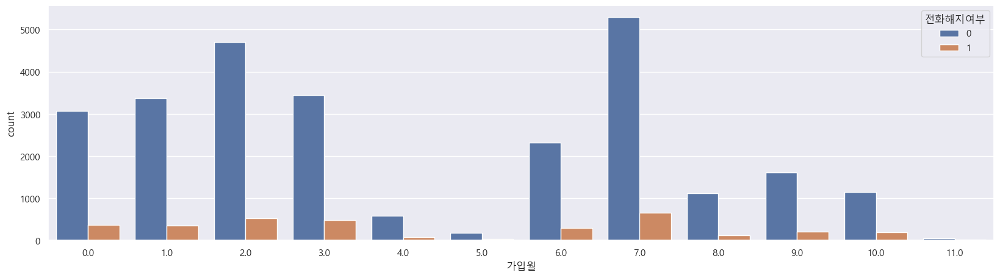

In [59]:
plt.figure(figsize=(20,5))
sns.countplot(data=train    , x='가입월', hue="전화해지여부")
plt.show()

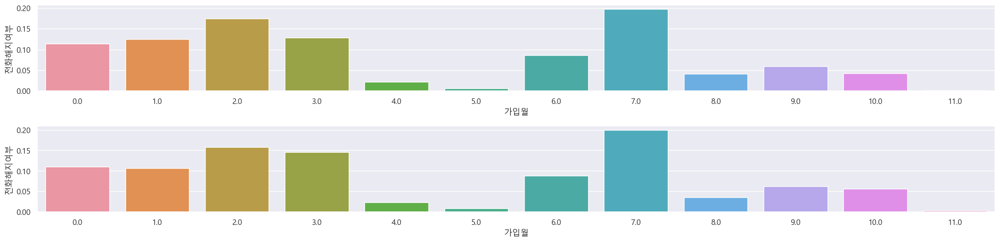

In [60]:
temp0 = train0.groupby('가입월')['전화해지여부'].count().sort_index()/s0
temp0 = temp0.reset_index()
temp1 = train1.groupby('가입월')['전화해지여부'].count().sort_index()/s1
temp1 = temp1.reset_index()
# temp0

plt.figure(figsize=(20,5))
plt.subplot(2,1,1)
sns.barplot(data=temp0, x='가입월', y='전화해지여부' ) 

plt.subplot(2,1,2)
sns.barplot(data=temp1, x='가입월', y='전화해지여부') 

plt.tight_layout()
plt.show()

### 통화 시간/횟수/요금
* 전체 시간, 횟수, 요금
* 단위 시간당 요금
* 1회 통화 시간

In [61]:
train['총통화시간']   = train['주간통화시간'] + train['저녁통화시간'] + train['밤통화시간']
train['총통화횟수']   = train['주간통화횟수'] + train['저녁통화횟수'] + train['밤통화횟수']
train['총통화요금']   = train['주간통화요금'] + train['저녁통화요금'] + train['밤통화요금']

train['주간시간당요금']   = train['주간통화요금']   / train['주간통화시간']
train['저녁시간당요금']   = train['저녁통화요금']   / train['저녁통화시간']
train['밤시간당요금']   = train['밤통화요금']   / train['밤통화시간']

train['시간당요금']   = train['총통화요금']   / train['총통화시간']
train['횟수당시간']   = train['총통화시간']   / train['총통화횟수']

test['총통화시간']   = test['주간통화시간'] + test['저녁통화시간'] + test['밤통화시간']
test['총통화횟수']   = test['주간통화횟수'] + test['저녁통화횟수'] + test['밤통화횟수']
test['총통화요금']   = test['주간통화요금'] + test['저녁통화요금'] + test['밤통화요금']

test['주간시간당요금']   = test['주간통화요금']   / test['주간통화시간']
test['저녁시간당요금']   = test['저녁통화요금']   / test['저녁통화시간']
test['밤시간당요금']   = test['밤통화요금']   / test['밤통화시간']

test['시간당요금']   = test['총통화요금']   / test['총통화시간']
test['횟수당시간']   = test['총통화시간']   / test['총통화횟수']

In [62]:
train.loc[5512, '주간시간당요금'] = 0

In [63]:
train0 = train[train['전화해지여부']==0]
train1 = train[train['전화해지여부']==1]

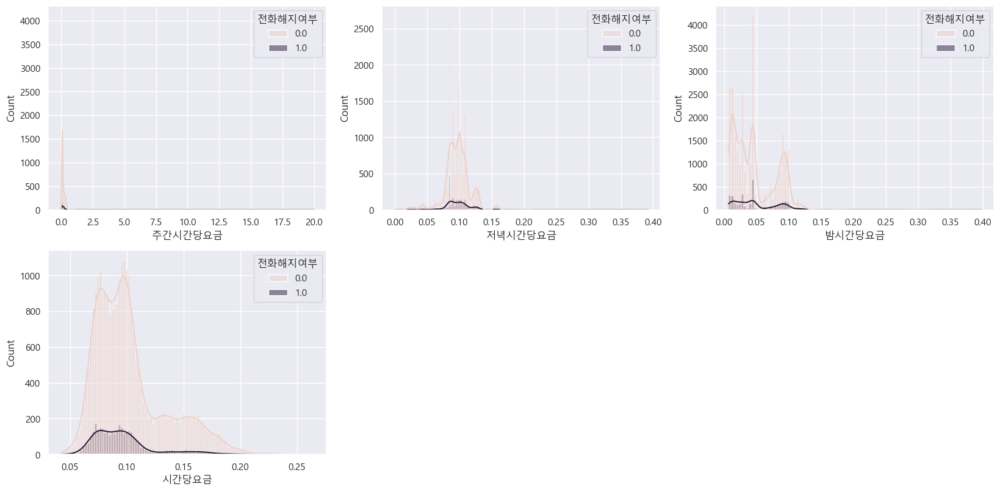

In [64]:
col_list = ['주간시간당요금','저녁시간당요금','밤시간당요금','시간당요금']
plt.figure(figsize=(20,20))
for i, col in enumerate(col_list):
    plt.subplot(4,3, i+1)
    sns.histplot(data=train, x=col, hue='전화해지여부', kde=True)

## 음성사서함이용

In [66]:
train[['전화해지여부', '음성사서함이용']].value_counts().sort_index()

전화해지여부  음성사서함이용
0.0     0.0        9651
        1.0        9439
        2.0           4
        3.0           6
        4.0           3
                   ... 
1.0     87.0          6
        88.0         18
        89.0         20
        116.0         1
        117.0         1
Length: 125, dtype: int64

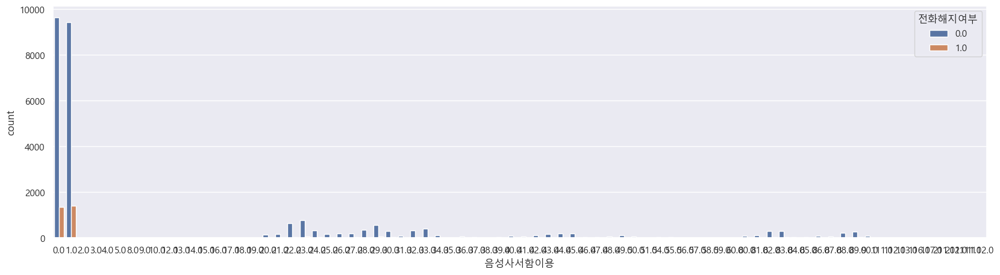

In [67]:
plt.figure(figsize=(20,5))
sns.countplot(data=train    , x='음성사서함이용', hue="전화해지여부")
plt.show()

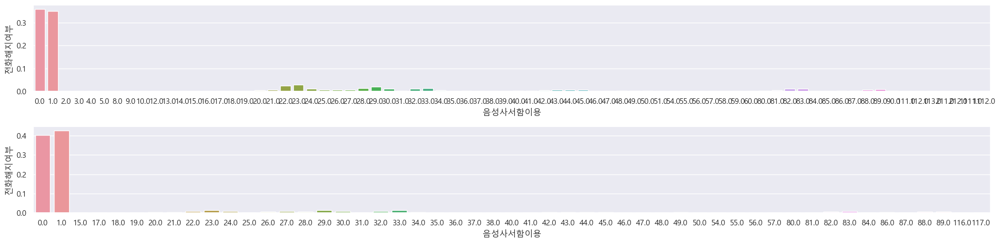

In [68]:
temp0 = train0.groupby('음성사서함이용')['전화해지여부'].count().sort_index()/s0
temp0 = temp0.reset_index()
temp1 = train1.groupby('음성사서함이용')['전화해지여부'].count().sort_index()/s1
temp1 = temp1.reset_index()
# temp0

plt.figure(figsize=(20,5))
plt.subplot(2,1,1)
sns.barplot(data=temp0, x='음성사서함이용', y='전화해지여부' ) 

plt.subplot(2,1,2)
sns.barplot(data=temp1, x='음성사서함이용', y='전화해지여부') 

plt.tight_layout()
plt.show()

In [69]:
train1['음성사서함이용'].describe()

count    3318.000000
mean        7.587101
std        18.348552
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max       117.000000
Name: 음성사서함이용, dtype: float64

In [70]:
train0['음성사서함이용'].describe()

count    26882.000000
mean        12.587159
std         25.566918
min          0.000000
25%          0.000000
50%          1.000000
75%         23.000000
max       1112.000000
Name: 음성사서함이용, dtype: float64

In [71]:
# 음성사서함 Fillna
fill_idx = train0[train0['음성사서함이용']>200].index.values
train.loc[fill_idx, '음성사서함이용']=200
train['음성사서함이용'].describe()

count    30200.000000
mean        11.944967
std         22.446071
min          0.000000
25%          0.000000
50%          1.000000
75%         22.000000
max        200.000000
Name: 음성사서함이용, dtype: float64

In [72]:
train0 = train[train['전화해지여부']==0]
train1 = train[train['전화해지여부']==1]

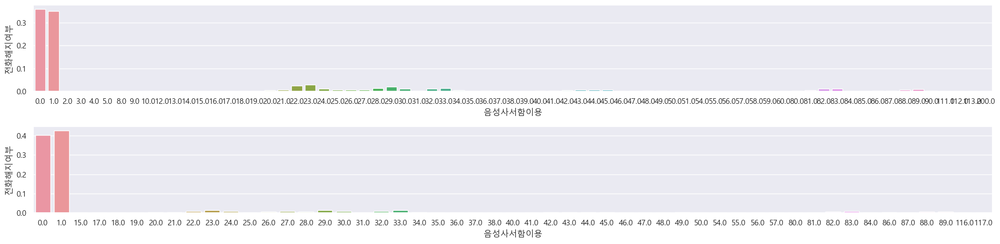

In [73]:
temp0 = train0.groupby('음성사서함이용')['전화해지여부'].count().sort_index()/s0
temp0 = temp0.reset_index()
temp1 = train1.groupby('음성사서함이용')['전화해지여부'].count().sort_index()/s1
temp1 = temp1.reset_index()
# temp0

plt.figure(figsize=(20,5))
plt.subplot(2,1,1)
sns.barplot(data=temp0, x='음성사서함이용', y='전화해지여부' ) 

plt.subplot(2,1,2)
sns.barplot(data=temp1, x='음성사서함이용', y='전화해지여부') 

plt.tight_layout()
plt.show()

## 상담전화건수

In [74]:
train[['상담전화건수','전화해지여부']].value_counts().sort_index()

상담전화건수  전화해지여부
0.0     0.0        5696
        1.0         607
1.0     0.0         754
        1.0          80
2.0     0.0       14844
        1.0        1678
3.0     0.0         986
        1.0         194
4.0     0.0        2288
        1.0         252
5.0     0.0         176
        1.0          58
6.0     0.0          91
        1.0         112
7.0     0.0           6
        1.0           7
8.0     0.0        2021
        1.0         313
9.0     0.0           3
        1.0          15
11.0    0.0          17
        1.0           2
dtype: int64

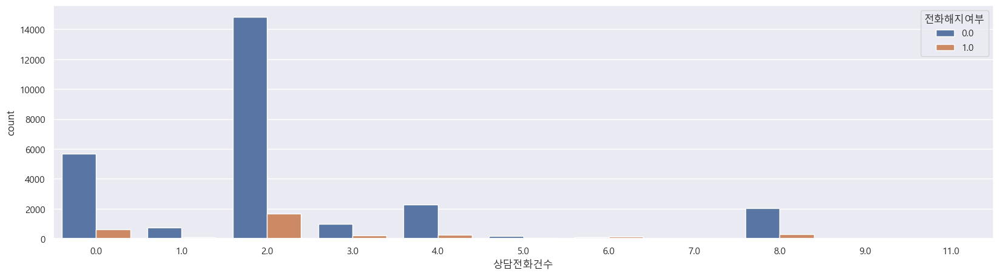

In [75]:
plt.figure(figsize=(20,5))
sns.countplot(data=train    , x='상담전화건수', hue="전화해지여부")
plt.show()

* 월별 상담전화건수

In [76]:
train.groupby(['가입기간월','전화해지여부'])['상담전화건수'].mean()

가입기간월  전화해지여부
0.0    0.0       2.707921
       1.0       3.562500
1.0    0.0       1.993852
       1.0       2.419355
2.0    0.0       2.052446
                   ...   
167.0  0.0       2.000000
       1.0       6.000000
175.0  0.0       2.000000
176.0  0.0       2.000000
184.0  0.0       1.666667
Name: 상담전화건수, Length: 80, dtype: float64

In [78]:
temp = train.groupby(['가입월','전화해지여부'])['상담전화건수'].mean().reset_index()
temp.head()

,가입월,전화해지여부,상담전화건수
0,0.0,0.0,2.138256
1,0.0,1.0,2.417582
2,1.0,0.0,2.156770
3,1.0,1.0,2.568182
4,2.0,0.0,2.632610


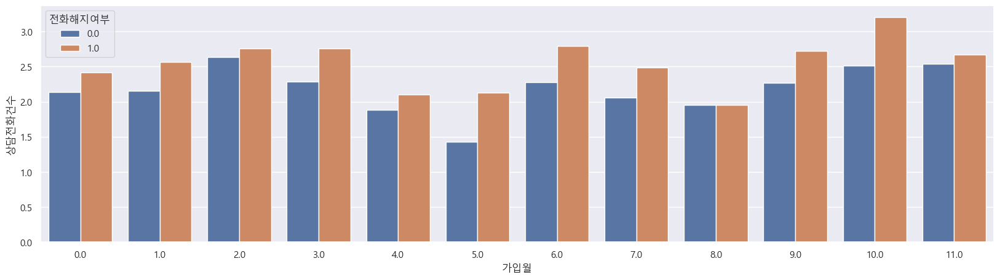

In [79]:
plt.figure(figsize=(20,5))
sns.barplot(data=temp    , x='가입월', y='상담전화건수', hue="전화해지여부")
plt.show()

# Outlier (Boxplot)

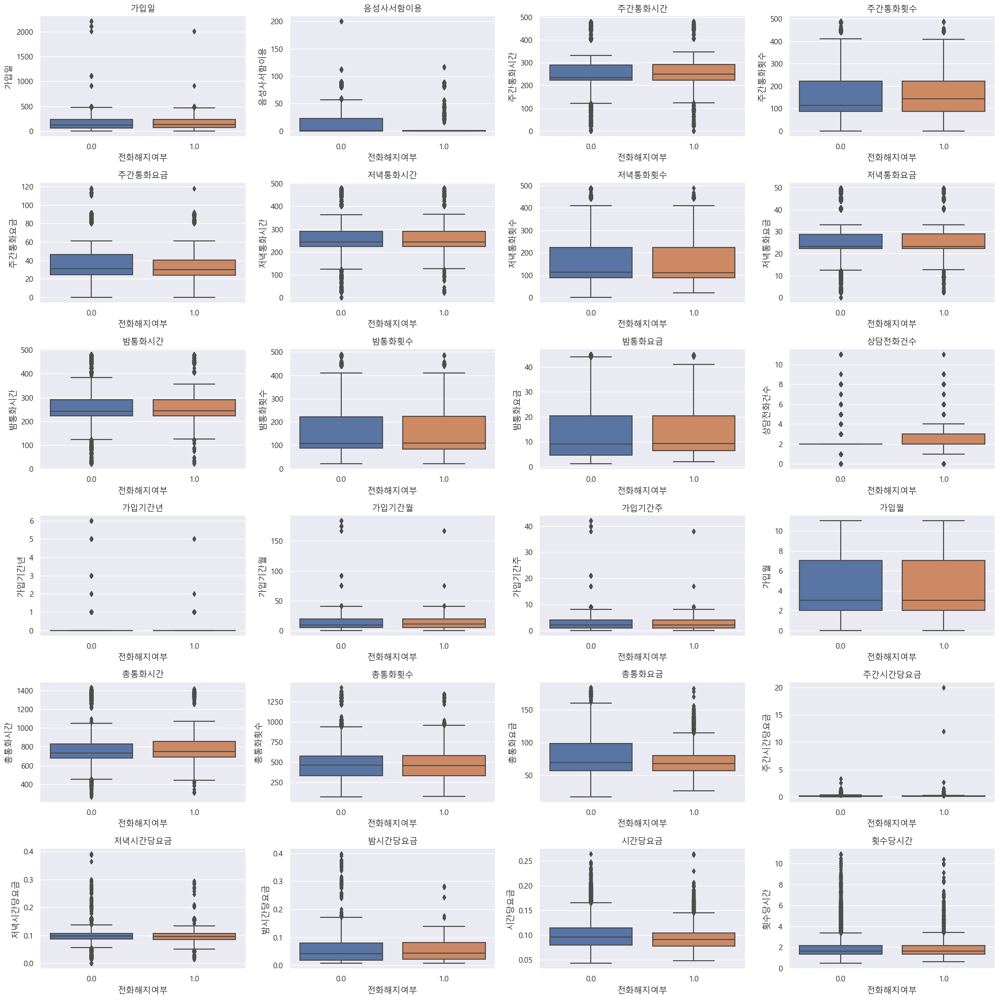

In [80]:
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(20,20))

for i, col in enumerate(test.columns) :
    r = i//4
    c = i%4
    sns.boxplot(data=train, y=col, x="전화해지여부", ax=axes[r][c])
    axes[r][c].set_title(col) 
plt.tight_layout()    
plt.show()

# Featuer 간 상관분석

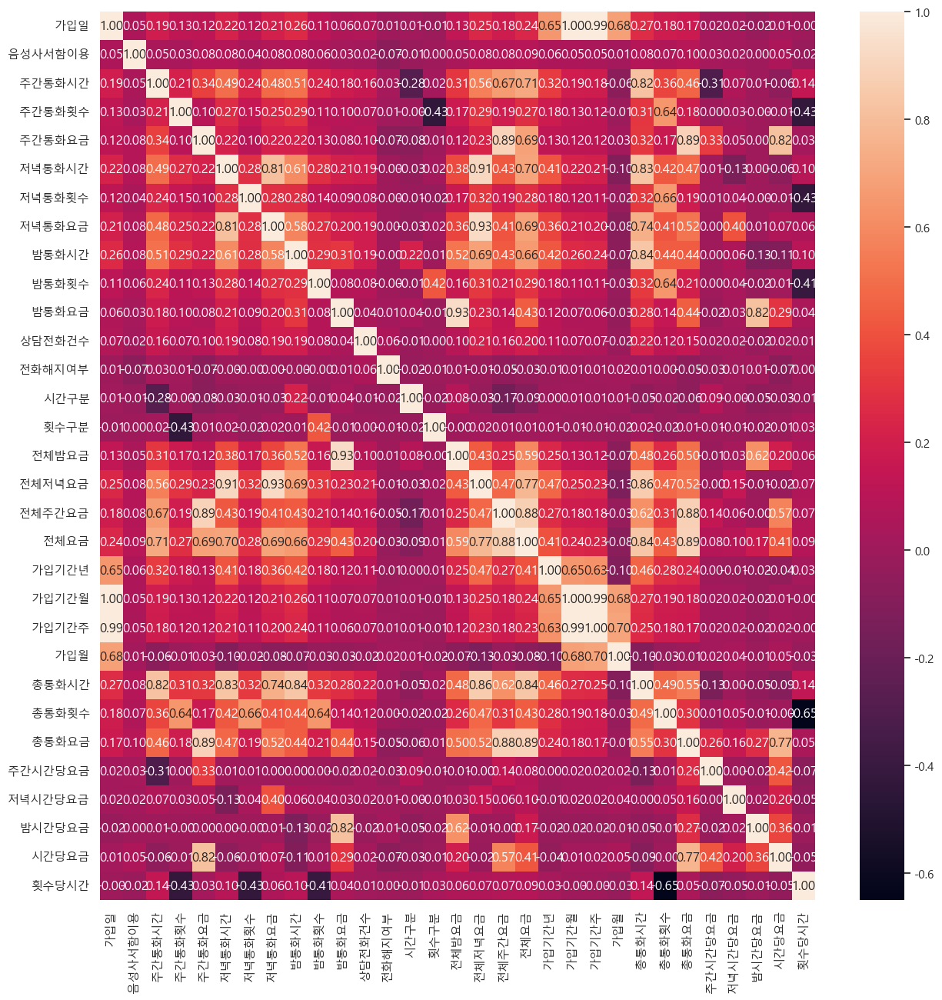

In [82]:
# 저녁 통화시간, 저녁 통화요금 corr 0.806827
plt.figure(figsize=(15,15))
sns.heatmap(train.corr(), fmt=".2f", annot=True)
plt.show()

* 정리
    * 음성사서함 정보 좀 중요함
        * 음성사서함에 2개 outlier같은 데이터 있으나, test에도 있어서 제거하면 안될듯!! (1000건이상)
        * 그럼 따로 feature를 빼고 제거할지, 그냥 나두면 scaling 할때 다른 값들의 연관도가 없어질 듯함.
    * feature 데이터들 scaling 해야 함.
    * Under 또는 Over Sampling 해야함.
    * 저녁 통화시간 횟수 요금의 min값이 해지해는 경우에 더 큼.
        * 통화 해지하는 사람은 모두 저녁에 통화를 한다. (일단 Train data에 따르면)
    * 횟수와 요금도... 시간 기준으로 gubun 파생변수를 만들었으나, 연관성은 확인하지 못함.
    * 저녁 통화 시간과 요금에 다중공선 0.8    
    
    <br>
    * 통화요금을 많이 내는 사람들이 의외로 해지를 안한다함.

# Feature Engineering

In [ ]:
train = pd.read_csv('./datasets/train.csv')
test = pd.read_csv('./datasets/test.csv')

train = train.set_index('ID')
test = test.set_index('ID')

drop_index = train[(train['가입기간년']==5)&(train['전화해지여부']==1)].index.values
train.drop(drop_index, axis=0)

fill_idx = train[(train['전화해지여부']==0)&['음성사서함이용']>200].index.values
train.loc[fill_idx, '음성사서함이용']=200
train['음성사서함이용'].describe()


# train['시간구분'] = 0
# train['시간구분'] = np.where((train['저녁통화시간']>train['주간통화시간']) & (train['저녁통화시간']>train['밤통화시간']), 1, train['시간구분'])
# train['시간구분'] = np.where((train['밤통화시간']>train['주간통화시간']) & (train['밤통화시간']>train['저녁통화시간']), 2, train['시간구분'])

# train['횟수구분'] = 0
# train['횟수구분'] = np.where((train['저녁통화횟수']>train['주간통화횟수']) & (train['저녁통화횟수']>train['밤통화횟수']), 1, train['횟수구분'])
# train['횟수구분'] = np.where((train['밤통화횟수']>train['주간통화횟수']) & (train['밤통화횟수']>train['저녁통화횟수']), 2, train['횟수구분'])

# train = pd.get_dummies(train, columns=['시간구분', '횟수구분'])

# train['전체통화횟수'] = train['주간통화횟수'] + train['저녁통화횟수'] + train['밤통화횟수']
# train['전체통화시간'] = train['주간통화시간'] + train['저녁통화시간'] + train['밤통화시간']
# train['전체통화요금'] = train['주간통화요금'] + train['저녁통화요금'] + train['밤통화요금']

# train['전체통화횟수비율'] = train['전체통화횟수']/train['가입일'] 
# train['전체통화시간비율'] = train['전체통화시간']/train['가입일'] 
# train['전체통화요금비율'] = train['전체통화요금']/train['가입일'] 

# train['음성사서함비율'] = train['음성사서함이용']/train['가입일'] 
# train['상담전화건수비율'] = train['상담전화건수']/train['가입일'] 

# train['전체통화횟수비율'] = (train['주간통화횟수'] + train['저녁통화횟수'] + train['밤통화횟수'])/train['가입일'] 
# train['전체통화시간비율'] = (train['주간통화시간'] + train['저녁통화시간'] + train['밤통화시간'])/train['가입일'] 
# train['전체통화요금비율'] = (train['주간통화요금'] + train['저녁통화요금'] + train['밤통화요금'])/train['가입일']


# test['음성사서함비율'] = test['음성사서함이용']/test['가입일'] 
# test['상담전화건수비율'] = test['상담전화건수']/test['가입일'] 

# test['전체통화횟수비율'] = (test['주간통화횟수'] + test['저녁통화횟수'] + test['밤통화횟수'])/test['가입일'] 
# test['전체통화시간비율'] = (test['주간통화시간'] + test['저녁통화시간'] + test['밤통화시간'])/test['가입일'] 
# test['전체통화요금비율'] = (test['주간통화요금'] + test['저녁통화요금'] + test['밤통화요금'])/test['가입일'] 

train.head()

In [ ]:
train.columns

In [ ]:
# Feature Scaling 1. log scaling
# col_list = ['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
#        '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수',
#            '전체통화횟수', '전체통화시간', '전체통화요금', '음성사서함비율', '상담전화건수비율', 
#              '전체통화횟수비율', '전체통화시간비율','전체통화요금비율']

# col_list = ['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
#        '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수',  '음성사서함비율',
#        '상담전화건수비율', '전체통화횟수비율', '전체통화시간비율', '전체통화요금비율']

col_list = ['가입일', '음성사서함이용', '주간통화시간', '주간통화횟수', '주간통화요금', '저녁통화시간', '저녁통화횟수',
       '저녁통화요금', '밤통화시간', '밤통화횟수', '밤통화요금', '상담전화건수']

for cl in col_list:
    train[cl]      = np.log1p( train[cl] )
    test[cl]      = np.log1p( test[cl] )

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

rs = RobustScaler()
rs.fit(train.drop('전화해지여부', axis=1).values)
train_s = pd.DataFrame(rs.transform(train.drop('전화해지여부', axis=1).values), columns=train.drop('전화해지여부', axis=1).columns)
train_s['전화해지여부'] = train['전화해지여부'].values 

In [ ]:
train.describe()

In [ ]:
# Over Sampling
from imblearn.over_sampling import SMOTE, ADASYN

train, _ = SMOTE(random_state=11).fit_resample(train, train['전화해지여부'])
# train_o, _ = ADASYN(random_state=11).fit_resample(train, train['전화해지여부'])

In [ ]:
# Over Sampling
# train_o, _ = SMOTE(random_state=11).fit_resample(train_s, train_s['전화해지여부'])
train_o, _ = ADASYN(random_state=11).fit_resample(train_s, train_s['전화해지여부'])
my_fit_score(train_o)

* Pychret model_selection

In [ ]:
from pycaret.classification import *
s = setup(train_o, target = '전화해지여부', silent=True) #, feature_selection = True)
best_model_list = compare_models(sort='f1', n_select = 3, budget_time = 0.5)

In [ ]:
lr = create_model('lr')
knn = create_model('knn')
xb = create_model('xgboost')
lg = create_model('lightgbm')
model_list = [lr, knn, xb, lg]
tuned_top5 = [tune_model(i) for i in model_list]

In [ ]:
tuned_top5[2]

In [ ]:
tuned_top5[3]

In [ ]:
tuned_top5[1]

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier


def my_fit_score(df) :
    model_list = [  ("RF"     , RandomForestClassifier(random_state=11)),
                    ("KNN", KNeighborsClassifier()),
                    ("XGB" , XGBClassifier(random_state=11)),
                    ("LGBM" , LGBMClassifier(random_state=11))
                 ]
   
    y= df['전화해지여부'] 

    X = df.drop('전화해지여부', axis=1)
    
    for tpl in model_list :
        model = tpl[1]
                
        X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2, stratify=y)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        f1_s = f1_score(y_test, y_pred)
    
        print(f"{tpl[0]} : {f1_s}") 
        print("-"*30)
        

In [ ]:
my_fit_score(train_o)

In [ ]:
train = pd.read_csv('./datasets/train.csv')
test = pd.read_csv('./datasets/test.csv')

train = train.set_index('ID')
test = test.set_index('ID')


train['총통화시간']   = train['주간통화시간'] + train['저녁통화시간'] + train['밤통화시간']
train['총통화횟수']   = train['주간통화횟수'] + train['저녁통화횟수'] + train['밤통화횟수']
train['총통화요금']   = train['주간통화요금'] + train['저녁통화요금'] + train['밤통화요금']

train['주간시간당요금']   = train['주간통화요금']   / train['주간통화시간']
train['저녁시간당요금']   = train['저녁통화요금']   / train['저녁통화시간']
train['밤시간당요금']   = train['밤통화요금']   / train['밤통화시간']

inf_idx= train[(train['주간통화시간']==0)].index.values
train.loc[inf_idx,'주간시간당요금'] = 0
inf_idx= train[(train['저녁통화시간']==0)].index.values
train.loc[inf_idx,'저녁시간당요금'] = 0
inf_idx= train[(train['밤통화시간']==0)].index.values
train.loc[inf_idx,'밤시간당요금'] = 0

train['가입기간년'] = train['가입일'] // 365
train['가입기간월'] = np.floor(train['가입일'] // 12)
# train['가입월']     = np.floor(train['가입일'] / 30) - (  ( np.floor(train['가입일'] / 30) / 12).astype(int) * 12  )  

train = train.drop(['주간통화요금','저녁통화요금','밤통화요금','주간통화시간','저녁통화시간','밤통화시간','가입일'], axis=1)


test['총통화시간']   = test['주간통화시간'] + test['저녁통화시간'] + test['밤통화시간']
test['총통화횟수']   = test['주간통화횟수'] + test['저녁통화횟수'] + test['밤통화횟수']
test['총통화요금']   = test['주간통화요금'] + test['저녁통화요금'] + test['밤통화요금']

test['주간시간당요금']   = test['주간통화요금']   / test['주간통화시간']
test['저녁시간당요금']   = test['저녁통화요금']   / test['저녁통화시간']
test['밤시간당요금']   = test['밤통화요금']   / test['밤통화시간']

inf_idx= test[(test['주간통화시간']==0)].index.values
test.loc[inf_idx,'주간시간당요금'] = 0
inf_idx= test[(test['저녁통화시간']==0)].index.values
test.loc[inf_idx,'저녁시간당요금'] = 0
inf_idx= test[(test['밤통화시간']==0)].index.values
test.loc[inf_idx,'밤시간당요금'] = 0

test['가입기간년']  = test['가입일'] // 365
test['가입기간월']  = np.floor(test['가입일'] // 12)
# test['가입월']      = np.floor(test['가입일'] / 30) - (  ( np.floor(train['가입일'] / 30) / 12).astype(int) * 12  )  
test = test.drop(['주간통화요금','저녁통화요금','밤통화요금','주간통화시간','저녁통화시간','밤통화시간','가입일'], axis=1)

drop_index = train[(train['가입기간년']==5)&(train['전화해지여부']==1)].index.values
train.drop(drop_index, axis=0)

fill_idx = train[(train['전화해지여부']==0)&['음성사서함이용']>200].index.values
train.loc[fill_idx, '음성사서함이용']=200
train['음성사서함이용'].describe()

# train['시간구분'] = 0
# train['시간구분'] = np.where((train['저녁통화시간']>train['주간통화시간']) & (train['저녁통화시간']>train['밤통화시간']), 1, train['시간구분'])
# train['시간구분'] = np.where((train['밤통화시간']>train['주간통화시간']) & (train['밤통화시간']>train['저녁통화시간']), 2, train['시간구분'])

# train['횟수구분'] = 0
# train['횟수구분'] = np.where((train['저녁통화횟수']>train['주간통화횟수']) & (train['저녁통화횟수']>train['밤통화횟수']), 1, train['횟수구분'])
# train['횟수구분'] = np.where((train['밤통화횟수']>train['주간통화횟수']) & (train['밤통화횟수']>train['저녁통화횟수']), 2, train['횟수구분'])

# train = pd.get_dummies(train, columns=['시간구분', '횟수구분'])

# train['전체통화횟수'] = train['주간통화횟수'] + train['저녁통화횟수'] + train['밤통화횟수']
# train['전체통화시간'] = train['주간통화시간'] + train['저녁통화시간'] + train['밤통화시간']
# train['전체통화요금'] = train['주간통화요금'] + train['저녁통화요금'] + train['밤통화요금']

# train['전체통화횟수비율'] = train['전체통화횟수']/train['가입일'] 
# train['전체통화시간비율'] = train['전체통화시간']/train['가입일'] 
# train['전체통화요금비율'] = train['전체통화요금']/train['가입일'] 

# train['음성사서함비율'] = train['음성사서함이용']/train['가입일'] 
# train['상담전화건수비율'] = train['상담전화건수']/train['가입일'] 

# train['전체통화횟수비율'] = (train['주간통화횟수'] + train['저녁통화횟수'] + train['밤통화횟수'])/train['가입일'] 
# train['전체통화시간비율'] = (train['주간통화시간'] + train['저녁통화시간'] + train['밤통화시간'])/train['가입일'] 
# train['전체통화요금비율'] = (train['주간통화요금'] + train['저녁통화요금'] + train['밤통화요금'])/train['가입일']


# test['음성사서함비율'] = test['음성사서함이용']/test['가입일'] 
# test['상담전화건수비율'] = test['상담전화건수']/test['가입일'] 

# test['전체통화횟수비율'] = (test['주간통화횟수'] + test['저녁통화횟수'] + test['밤통화횟수'])/test['가입일'] 
# test['전체통화시간비율'] = (test['주간통화시간'] + test['저녁통화시간'] + test['밤통화시간'])/test['가입일'] 
# test['전체통화요금비율'] = (test['주간통화요금'] + test['저녁통화요금'] + test['밤통화요금'])/test['가입일'] 

train.head()

In [ ]:
train.columns

In [ ]:
col_list = ['음성사서함이용', '주간통화횟수', '저녁통화횟수', '밤통화횟수', '상담전화건수', '총통화시간',
       '총통화횟수', '총통화요금', '주간시간당요금', '저녁시간당요금', '밤시간당요금', '가입기간년', '가입기간월']

for cl in col_list:
    train[cl]      = np.log1p( train[cl] )
    test[cl]      = np.log1p( test[cl] )

In [ ]:
train['전화해지여부'].value_counts()

In [ ]:
train.info()

In [ ]:
from sklearn.preprocessing import Binarizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
# from sklearn.preprocessing import Binarizer

y= train['전화해지여부'] 
X = train.drop('전화해지여부', axis=1)

model = XGBClassifier(random_state=11)

model.fit(X, y)
y_pred = model.predict(test)
y_prob = model.predict_proba(test)
# y_prob.shape
br = Binarizer(threshold=0.25)
y_pred = br.fit_transform(y_prob[:, 1].reshape(-1, 1))

# y_pred

In [ ]:
y= train['전화해지여부'] 

X = train.drop('전화해지여부', axis=1)

model = XGBClassifier(random_state=11)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=11, test_size=0.2)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)

br = Binarizer(threshold=0.25)
y_pred = br.fit_transform(y_prob[:, 1].reshape(-1, 1))

f1_s = f1_score(y_test, y_pred)
print(f1_s)
confusion_matrix(y_test, y_pred)